In [1]:
import sys
import argparse
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
import numpy as np
import pandas as pd

import csv
import gzip

import scipy.io
import numpy as np 

import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.pyplot import rc_context
import anndata
import torch

# --- MATPLOTLIB SETTINGS ---
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rc
rc_params = {
    "font.family": "sans-serif", # "text.usetex": True,
    "font.serif" : ['Arial'], # "font.size" : 6,
    "font.weight" : "normal",
    'xtick.labelsize' : 5,
    'ytick.labelsize' : 5,
    'legend.fontsize' : 5,
    'axes.labelsize' : 6,
    'axes.linewidth': 0.8,
    'lines.linewidth' : 1,
    'axes.titlesize' : 7, # figure.titlesize,
    'legend.title_fontsize' : 5
}
matplotlib.rcParams.update(rc_params)
margins = {  #     vvv margin in inches
    "left"   :     0.2,
    'right' : 1.0,
    'bottom' : 0.15
}

import helper_functions



/Users/mingyaolab/opt/anaconda3/envs/misalignment/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [395]:

# --- INIT ---



# which data to use
head_folder = "/".join(os.getcwd().split("/")[:3])
data_head_folder = '%s/Dropbox/aorta_circadian_data/datasets/joint' % head_folder
hvg_to_use = 'prior_knowledge_guided' # 'transformed_X_outlier_variance'
cluster_resolution = 0.05
subcluster_resolution = 0.20


# get corresponding paths
adata_path = '%s/adata_qc_filtered.h5ad' % data_head_folder
hvg_folder = '%s/data_annotations/hvg/%s' % (data_head_folder,hvg_to_use)
scvi_res_folder = '%s/scvi_res' % hvg_folder
scvi_mean_embedding_df_path = '%s/scvi_mean_embedding.tsv' % scvi_res_folder
umap_path_out = '%s/scvi_mean_umap_embedding.tsv' % scvi_res_folder

# clusters
clustering_folder = '%s/clustering/res_%s' % (scvi_res_folder, str(cluster_resolution))
cluster_df_fileout = '%s/clusters.tsv' % (clustering_folder)

# SMC clusters
subclustering_folder = '%s/subclustering/res_%s' % (clustering_folder,subcluster_resolution)
subcluster_df_fileout = '%s/smc_subclusters.tsv' % (subclustering_folder)


# settings
mesor_frac_thresh = 0.9
mesor_effect_thresh = 0.3 / np.log10(np.e)
amp_frac_thresh = 0.9
amp_effect_thresh = 0.2 / np.log10(np.e)
acrophase_frac_thresh = 0.1
acrophase_effect_thresh = 3 * (np.pi / 12.0)
frac_circadian_samples_crossing_zero_thresh = 0.1
log10_bf_thresh = 2
num_waveform_samples = 300
use_log_prop_fft = True
frac_cell_detected_thresh = 0.1
use_subclusters = False

# folder out
folder_out = '%s/Dropbox/aorta_circadian_data/results/fig_2_male_aligned_vs_female_aligned' % head_folder
if use_subclusters:
    folder_out = '%s/smc_subclusters' % folder_out
if not os.path.exists(folder_out):
    os.makedirs(folder_out)


# set the cluster column
if use_subclusters:
    clustering_folder = subclustering_folder
    cluster_df_fileout = subcluster_df_fileout



In [396]:
# --- LOAD THE ADATA ---

adata = anndata.read_h5ad(adata_path)

adata



AnnData object with n_obs × n_vars = 145271 × 32285
    obs: 'sample_id', 'within_experiment_batch_id', 'lib_size', 'sex', 'misaligned', 'zt', 'bmal1_ko', 'batch', 'percent_mito', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mito_qc_pass', 'umi_qc_pass', 'doublet_qc_pass', 'doublet_score', 'qc_pass', 'concat_batch', 'description'
    var: 'ensembl_id', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'log1p_total_counts-2'

In [397]:
# --- ADD EMBEDDINGS TO ADATA ---



# ** load embeddings and clusters **
scvi_mean_embedding_df = pd.read_table(scvi_mean_embedding_df_path,sep='\t',index_col='barcode')
umap_embedding_df = pd.read_table(umap_path_out,sep='\t',index_col='barcode')
cluster_df = pd.read_table(cluster_df_fileout,sep='\t',index_col='index')
subcluster_df = pd.read_table(subcluster_df_fileout,sep='\t',index_col='index')


# ** make sure everything in the same order
adata = adata[list(scvi_mean_embedding_df.index)]
umap_umap_embedding_df = umap_embedding_df.loc[list(scvi_mean_embedding_df.index)]
cluster_df = cluster_df.loc[list(scvi_mean_embedding_df.index)]
subcluster_df = subcluster_df.loc[list(scvi_mean_embedding_df.index)]


# ** add embeddings **
adata.obsm["X_scVI"] = np.array(scvi_mean_embedding_df)
adata.obsm["X_scVI_umap"] = np.array(umap_embedding_df)
if use_subclusters:
    adata.obs["cluster"] = np.array(cluster_df['smc_subcluster'])
else:
    adata.obs["cluster"] = np.array(cluster_df['leiden_scvi_cluster'])
adata


AnnData object with n_obs × n_vars = 145271 × 32285
    obs: 'sample_id', 'within_experiment_batch_id', 'lib_size', 'sex', 'misaligned', 'zt', 'bmal1_ko', 'batch', 'percent_mito', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mito_qc_pass', 'umi_qc_pass', 'doublet_qc_pass', 'doublet_score', 'qc_pass', 'concat_batch', 'description', 'cluster'
    var: 'ensembl_id', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'log1p_total_counts-2'
    obsm: 'X_scVI', 'X_scVI_umap'

In [398]:
# --- GET UNIQUE DESCRIPTOINS / CELL TYPES AND SET THE CLUSTER - CELL_TYPE DICT ---

# ** get the unique descriptions **
descriptions = list(adata.obs['description'].unique())

# ** get the unique clusters **
if use_subclusters:
    clusters = [0,1,2,3,4,5]
else:
    clusters = [0,1,2,3]

# ** get the cluster cell type dict **
if use_subclusters:
    smc_subcluster_cell_type_names = list(map(lambda x: "SMC%s" % int(x), clusters))
    cluster_cell_type_dict = dict(zip(clusters,
                                      smc_subcluster_cell_type_names))
else:
    cluster_cell_type_dict = dict(zip([0,1,2,3,4,5,6,7,8],
                                      ['SMC','Fibroblast','Endothelial', 'Macrophage', 'Erythrocyte', 'T', 'Oligodendrocyte', 'Endothelial2', 'Neuron']))




In [399]:
# --- LIMIT CLUSTERS ---

if use_subclusters:
    clusters = [0,1,2,3,4]
else:
    clusters = [0,1,2,3]
    
clusters
    

[0, 1, 2, 3]

In [400]:
# --- MAKE THE FOLDER OUTS ---

# head folder
reg_head_folder = '%s/nonparametric_reg' % clustering_folder


# subfolders for each cluster / condition combo
cluster_description_folder_out_dict = {}
for cluster in clusters:
    cluster_reg_folder = '%s/cluster_%s' % (reg_head_folder,cluster)
    for description in descriptions:
        cluster_description_reg_folder = '%s/%s' % (cluster_reg_folder,description)

        # update dict
        if cluster not in cluster_description_folder_out_dict:
            cluster_description_folder_out_dict[cluster] = {}
        cluster_description_folder_out_dict[cluster][description] = cluster_description_reg_folder

    
    

In [401]:
# --- LOAD THE GENES TO ESTIMATE ---

genes_to_est_fileout = '%s/genes_to_est.txt' % reg_head_folder
with open(genes_to_est_fileout) as file_obj:
    reg_genes_to_est = list(map(lambda x: x.replace('\n',""), file_obj.readlines()))
    
    
len(reg_genes_to_est)




22167

Num female cyclers: 851, num male cyclers: 754
cluster 0; num genes detected in male: 8724; num genes detected in female: 8355
cluster 0; num cells in male: 20998; num cells in female: 29221
Num female cyclers: 223, num male cyclers: 237
cluster 1; num genes detected in male: 6880; num genes detected in female: 6783
cluster 1; num cells in male: 3469; num cells in female: 4149
Num female cyclers: 431, num male cyclers: 207
cluster 2; num genes detected in male: 7785; num genes detected in female: 7446
cluster 2; num cells in male: 588; num cells in female: 466
Num female cyclers: 83, num male cyclers: 88
cluster 3; num genes detected in male: 6334; num genes detected in female: 5949
cluster 3; num cells in male: 360; num cells in female: 423


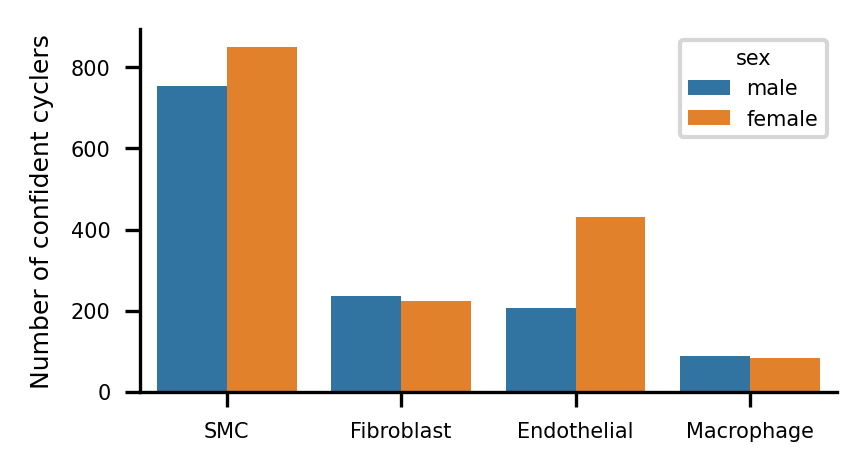

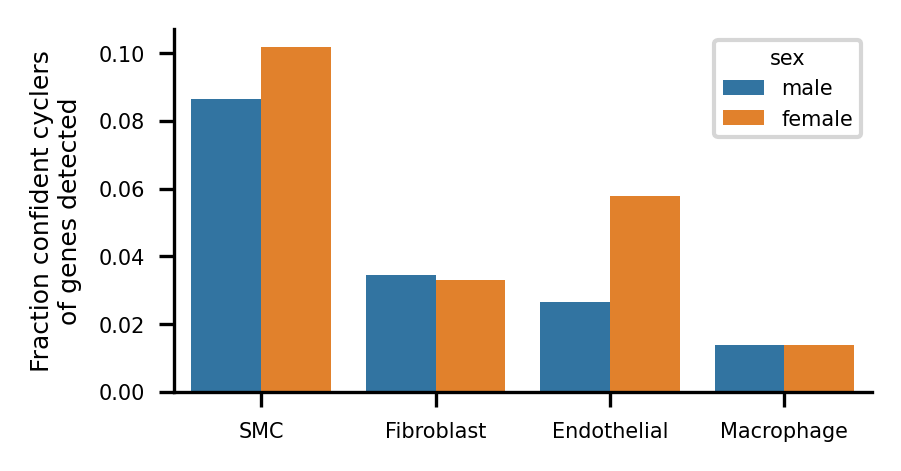

In [402]:
# --- HOW MANY CYCLERS ARE THERE IN EACH CELL TYPE IN FEMALES? ---


num_female_cyclers_list, num_male_cyclers_list = [], []
norm_num_female_cyclers_list, norm_num_male_cyclers_list = [], []

for cluster in clusters:
    
    # load params for female controls
    female_gene_log_alpha_df, female_gene_log_beta_df, female_gene_log_min_max_df, female_gene_stat_df = helper_functions.load_param_dfs_from_path(cluster_description_folder_out_dict[cluster]['female aligned bmal1-control'])
    male_gene_log_alpha_df, male_gene_log_beta_df, male_gene_log_min_max_df, male_gene_stat_df = helper_functions.load_param_dfs_from_path(cluster_description_folder_out_dict[cluster]['male aligned bmal1-control'])

    # get the number of cells
    female_cluster_adata = adata[(adata.obs['cluster'] == cluster) & (adata.obs['description'] == 'female aligned bmal1-control')]
    male_cluster_adata = adata[(adata.obs['cluster'] == cluster) & (adata.obs['description'] == 'male aligned bmal1-control')]
    
    # compute the fraction of genes passing the detection threshold in cell type
    female_num_genes_detected = np.sum(female_gene_stat_df['frac_cell_detected'] >= frac_cell_detected_thresh)
    male_num_genes_detected = np.sum(male_gene_stat_df['frac_cell_detected'] >= frac_cell_detected_thresh)


    # get the cycler stat df
    female_cycler_stat_df = female_gene_stat_df[np.array(female_gene_stat_df['waveform_over_circadian_component_subtracted_log10_bf'] >= log10_bf_thresh) & np.array(female_gene_stat_df['frac_cell_detected'] >= frac_cell_detected_thresh)] 
    male_cycler_stat_df = male_gene_stat_df[np.array(male_gene_stat_df['waveform_over_circadian_component_subtracted_log10_bf'] >= log10_bf_thresh) & np.array(male_gene_stat_df['frac_cell_detected'] >= frac_cell_detected_thresh)] 

    
    # get the number of cyclers
    num_female_cyclers = len(female_cycler_stat_df)
    num_male_cyclers = len(male_cycler_stat_df)
    
    
    # print info
    print('Num female cyclers: %s, num male cyclers: %s' % (num_female_cyclers,num_male_cyclers))
    print("cluster %s; num genes detected in male: %s; num genes detected in female: %s" % (cluster, round(male_num_genes_detected,2), round(female_num_genes_detected,2)))
    print("cluster %s; num cells in male: %s; num cells in female: %s" % (cluster, female_cluster_adata.shape[0], male_cluster_adata.shape[0]))
    
    # add
    num_female_cyclers_list.append(num_female_cyclers)
    num_male_cyclers_list.append(num_male_cyclers)
    norm_num_female_cyclers_list.append(num_female_cyclers / female_num_genes_detected)
    norm_num_male_cyclers_list.append(num_male_cyclers / male_num_genes_detected)
    

    
    
# # ** viz **
# fig, ax = plt.subplots(figsize = (3,1.6),dpi=300)
# plt.bar(clusters,num_female_cyclers_list,color='k',alpha=0.6)
# # plt.xticks(clusters,['SMC','Fibroblast', 'Endothelial', 'Macrophage', 'Unknown1','Unknown2','Unknown3'],rotation=45)
# plt.xticks(clusters,list(map(lambda x: cluster_cell_type_dict[x],clusters)),rotation=45)
# sns.despine()
# plt.ylabel("Number of detected\ncircadian cyclers")
# fileout = '%s/num_cyclers_per_cluster.pdf' % folder_out
# plt.savefig(fileout,bbox_inches='tight')
# plt.show()





# raw number detected
df = pd.DataFrame()
df['num_cyclers'] = num_male_cyclers_list + num_female_cyclers_list
df['sex'] = (['male'] * len(clusters)) + (['female'] * len(clusters))
df['cell_type'] = list(map(lambda x: cluster_cell_type_dict[x],clusters)) * 2


fig, ax = plt.subplots(figsize = (3,1.6),dpi=300)
sns.barplot(data = df, x = 'cell_type', y = 'num_cyclers', hue = 'sex')
sns.despine()
plt.xlabel("")
plt.ylabel("Number of confident cyclers")
fileout = '%s/m_vs_f_num_cyclers_per_cluster.pdf' % folder_out
plt.savefig(fileout,bbox_inches='tight')
plt.show()


# norm number detected
df = pd.DataFrame()
df['frac_cyclers'] = norm_num_male_cyclers_list + norm_num_female_cyclers_list
df['sex'] = (['male'] * len(clusters)) + (['female'] * len(clusters))
df['cell_type'] = list(map(lambda x: cluster_cell_type_dict[x],clusters)) * 2


fig, ax = plt.subplots(figsize = (3,1.6),dpi=300)
sns.barplot(data = df, x = 'cell_type', y = 'frac_cyclers', hue = 'sex',ax=ax)
sns.despine()
plt.xlabel("")
plt.ylabel("Fraction confident cyclers\nof genes detected")
fileout = '%s/m_vs_f_frac_cyclers_per_cluster.pdf' % folder_out
plt.savefig(fileout,bbox_inches='tight')
plt.show()





In [404]:
# --- TEMP: SET THE CLUSTER --- 

cluster = 3



In [405]:
# --- SET THE CONDITIONS WE WANT TO COMPARE ---

condit_1 = 'male aligned bmal1-control'
condit_2 = 'female aligned bmal1-control'




In [407]:
# --- LOAD PARAMS ---

# ** load the parameters for the two conditions **
gene_log_alpha_df_1, gene_log_beta_df_1, gene_log_min_max_df_1, gene_stat_df_1 = helper_functions.load_param_dfs_from_path(cluster_description_folder_out_dict[cluster][condit_1])
gene_log_alpha_df_2, gene_log_beta_df_2, gene_log_min_max_df_2, gene_stat_df_2 = helper_functions.load_param_dfs_from_path(cluster_description_folder_out_dict[cluster][condit_2])


# ** filter (must be detected in either male or female) **

# clock and ubiq genes
clock_and_ubiq_path = '%s/Desktop/tempo/data/core_clock_and_ubiq_genes.txt' % head_folder
clock_and_ubiq_genes = np.array(pd.read_table(clock_and_ubiq_path,header=None).iloc[:,0])

# hemoglobin genes
hemoglobin_genes = list(filter(lambda x: x[:2] == 'Hb' and '-' in x, adata.var_names))

# genes to filter 1
genes_to_filter_1 = list(gene_stat_df_1[np.array(gene_stat_df_1['frac_cell_detected'] < frac_cell_detected_thresh) & np.array(~np.isin(gene_stat_df_1.index,clock_and_ubiq_genes))].index)
genes_to_filter_1 = list(set(genes_to_filter_1).union(set(hemoglobin_genes)))

# genes to filter 2
genes_to_filter_2 = list(gene_stat_df_2[np.array(gene_stat_df_2['frac_cell_detected'] < frac_cell_detected_thresh) & np.array(~np.isin(gene_stat_df_2.index,clock_and_ubiq_genes))].index)
genes_to_filter_2 = list(set(genes_to_filter_2).union(set(hemoglobin_genes)))

# intersection
genes_to_filter = list(set(genes_to_filter_2).intersection(set(genes_to_filter_1)))

# get the genes to use
common_genes = list(set(gene_log_alpha_df_1.index).intersection(set(gene_log_alpha_df_2.index)).difference(set(genes_to_filter)))
common_genes = sorted(common_genes)

# filter
gene_log_alpha_df_1, gene_log_beta_df_1, gene_log_min_max_df_1, gene_stat_df_1 = gene_log_alpha_df_1.loc[common_genes], gene_log_beta_df_1.loc[common_genes], gene_log_min_max_df_1.loc[common_genes], gene_stat_df_1.loc[common_genes]
gene_log_alpha_df_2, gene_log_beta_df_2, gene_log_min_max_df_2, gene_stat_df_2 = gene_log_alpha_df_2.loc[common_genes], gene_log_beta_df_2.loc[common_genes], gene_log_min_max_df_2.loc[common_genes], gene_stat_df_2.loc[common_genes]


# ** turn into Tensors **

# condit 1
gene_log_min_1 = torch.Tensor(np.array(gene_log_min_max_df_1['log_min'])) 
gene_log_max_1 = torch.Tensor(np.array(gene_log_min_max_df_1['log_max']))
gene_log_alpha_1 = torch.Tensor(np.array(gene_log_alpha_df_1).T)
gene_log_beta_1 = torch.Tensor(np.array(gene_log_beta_df_1).T)

# condit 2
gene_log_min_2 = torch.Tensor(np.array(gene_log_min_max_df_2['log_min'])) 
gene_log_max_2 = torch.Tensor(np.array(gene_log_min_max_df_2['log_max']))
gene_log_alpha_2 = torch.Tensor(np.array(gene_log_alpha_df_2).T)
gene_log_beta_2 = torch.Tensor(np.array(gene_log_beta_df_2).T)




In [408]:
# --- GET SAMPLED WAVEFORMS AND FFT'S  ---



# get the samples log props
sampled_log_prop_1,_ = helper_functions.get_log_prop_samples(cluster,condit_1,num_waveform_samples,cluster_description_folder_out_dict,gene_list=common_genes)
sampled_log_prop_2,_ = helper_functions.get_log_prop_samples(cluster,condit_2,num_waveform_samples,cluster_description_folder_out_dict,gene_list=common_genes)

# get the number of grid points
num_grid_points = sampled_log_prop_1.shape[1]

# ** run FFT **
if use_log_prop_fft:
    sampled_fft_1 = np.fft.fft(sampled_log_prop_1,axis=1)
    sampled_fft_2 = np.fft.fft(sampled_log_prop_2,axis=1)
else:
    sampled_fft_1 = np.fft.fft(torch.exp(sampled_log_prop_1),axis=1)
    sampled_fft_2 = np.fft.fft(torch.exp(sampled_log_prop_2),axis=1)


# ** get circadian index for FFT's **
freqs = np.fft.fftfreq(num_grid_points,d=24.0/num_grid_points)
periods = 1 / freqs
circadian_index = np.where(np.isin(periods,[24]))[0][0]





/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_42586/1379934008.py:23: RuntimeWarning: divide by zero encountered in true_divide
  periods = 1 / freqs


62


KeyboardInterrupt: 

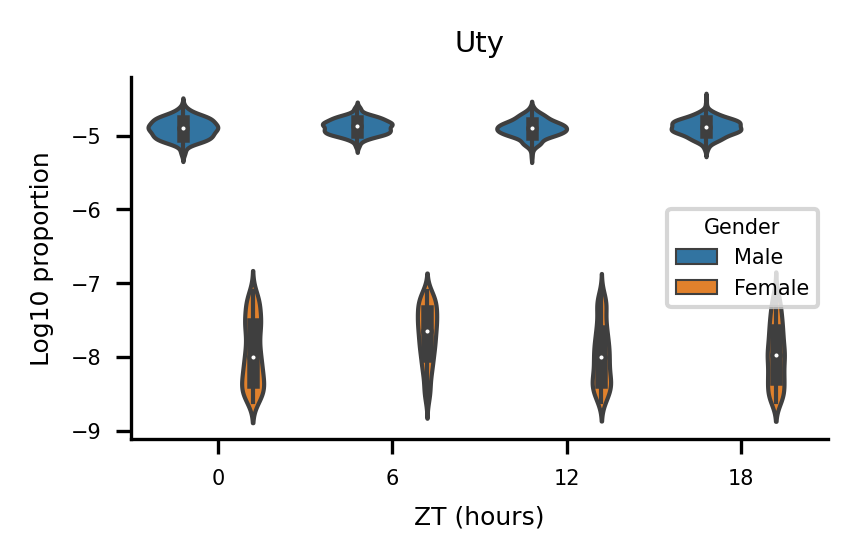

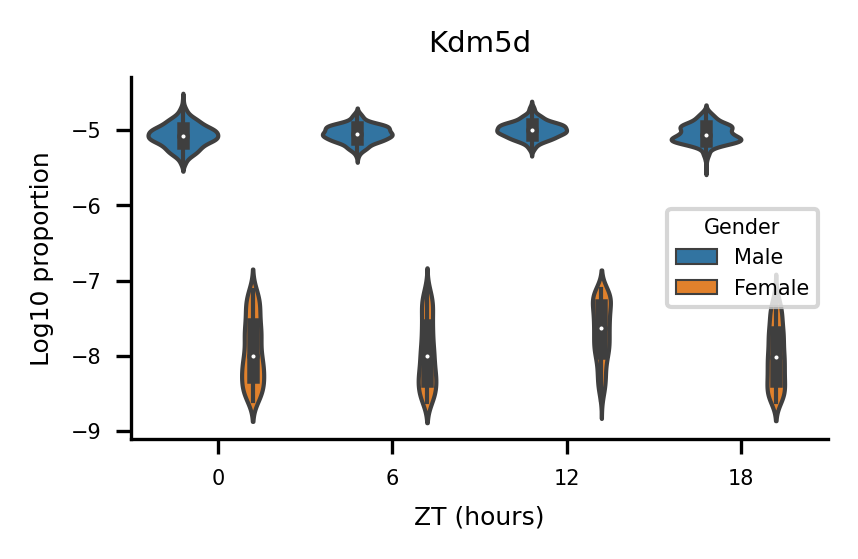

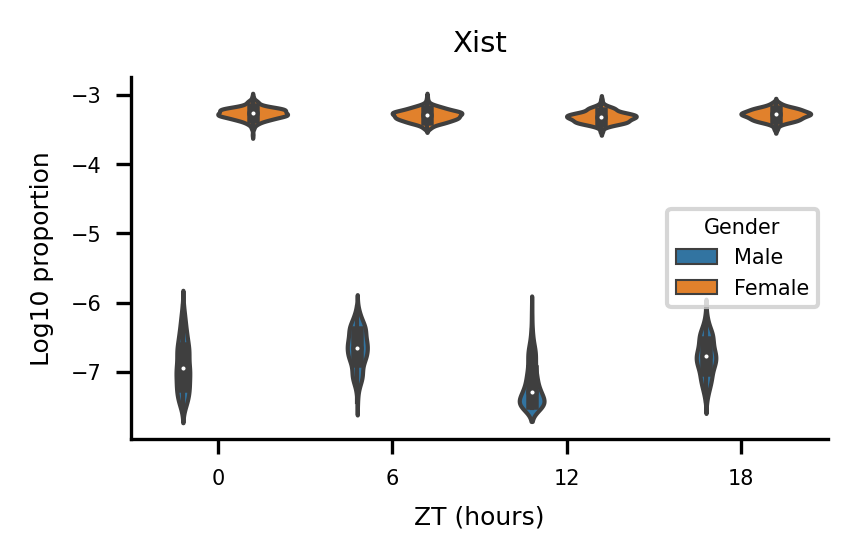

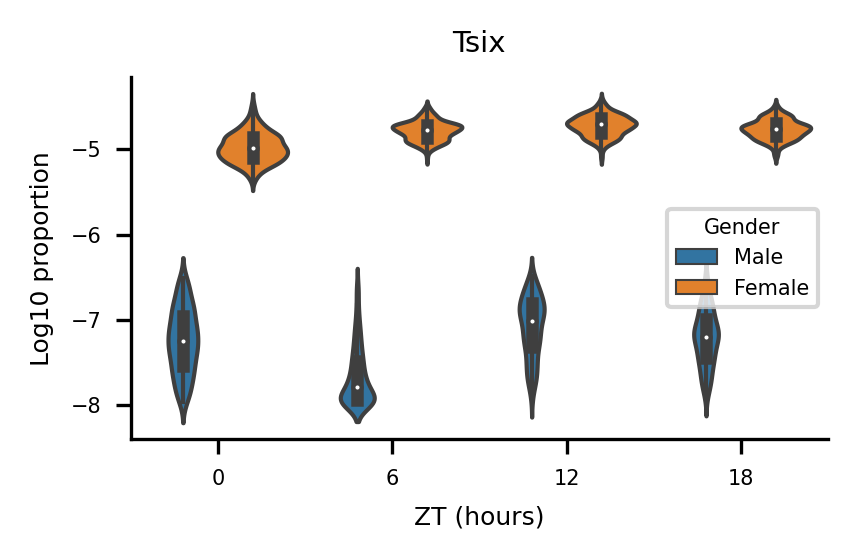

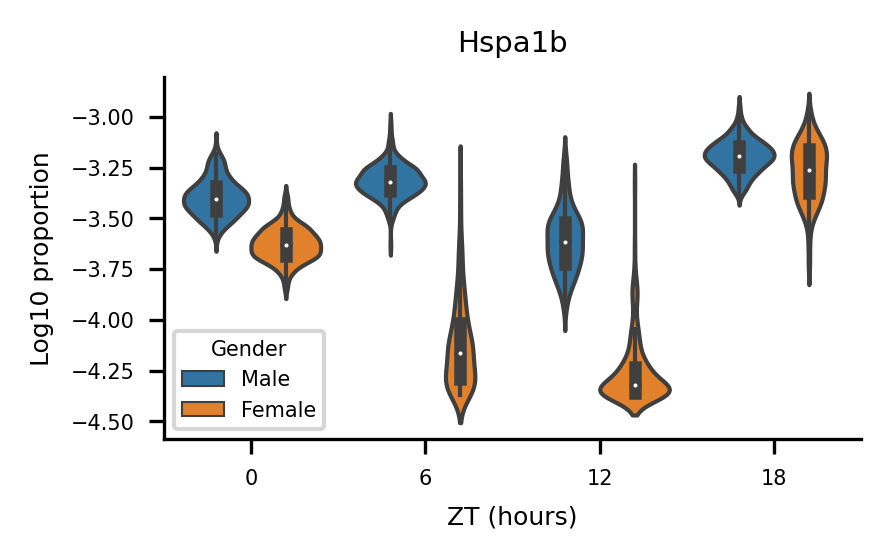

Error in callback <function flush_figures at 0x7ff7206230a0> (for post_execute):


KeyboardInterrupt: 

In [387]:
# --- GET DE GENES ---

# ** get sampled log prop dif **
sampled_log_prop_dif = sampled_log_prop_2 - sampled_log_prop_1

# ** get the 95% interval for each **
interval_low = torch.Tensor(np.percentile(sampled_log_prop_1, 2.5, axis=0)) # [num_time_points x num_genes]
interval_high = torch.Tensor(np.percentile(sampled_log_prop_1, 97.5, axis=0))

# ** get the fraction of samples outside of the interval **
samples_outside_interval = (sampled_log_prop_2 < interval_low.unsqueeze(0)) | (sampled_log_prop_2 > interval_high.unsqueeze(0))
fraction_samples_out_interval = torch.mean(samples_outside_interval.float(),dim=0) # [num_time_points x num_genes]
max_fraction_samples_out_interval = torch.max(fraction_samples_out_interval,dim=0).values
avg_fraction_samples_out_interval = torch.mean(fraction_samples_out_interval,dim=0)
nll_hat = -1 * torch.sum(torch.sum((torch.abs(sampled_log_prop_dif) / (interval_high - interval_low).unsqueeze(0)),dim=0),dim=0)


# ** de_df **
de_df = pd.DataFrame()
de_df['gene'] = common_genes
de_df['max_fraction_samples_out_interval'] = max_fraction_samples_out_interval
de_df['avg_fraction_samples_out_interval'] = avg_fraction_samples_out_interval
de_df['nll_hat'] = nll_hat
de_df = de_df.set_index('gene')
de_df = de_df.sort_values(['nll_hat'],ascending=True)
signif_de_df = de_df[de_df['max_fraction_samples_out_interval'] >= 0.80]
print(len(signif_de_df))

# ** write out **
subfolder_out = '%s/differential_expression/%s' % (folder_out, cluster_cell_type_dict[cluster])
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/de_df.tsv' % (subfolder_out)
de_df = de_df.to_csv(fileout,sep='\t')


# ** viz the most different genes
for z, gene in enumerate(signif_de_df.index):
    sampled_log_props = [sampled_log_prop_1,sampled_log_prop_2]
    condit_label = 'Gender'
    condits = ['Male', 'Female']
    gene_of_interest = gene
    gene_names = common_genes
    import importlib
    importlib.reload(helper_functions)
    fig,ax = helper_functions.make_temporal_violin_plots(sampled_log_props, condit_label, condits, gene_of_interest, gene_names)

    # ** make the folder out **
    subfolder_out = '%s/example_de_waveform_genes/%s/most_different' % (folder_out, cluster_cell_type_dict[cluster])
    if not os.path.exists(subfolder_out):
        os.makedirs(subfolder_out)

    fileout='%s/%s_%s.pdf' % (subfolder_out,z,gene_of_interest)
    plt.savefig(fileout,bbox_inches='tight')





In [ ]:
gene_stat_df_2.loc['Egr1']

In [ ]:
gene_stat_df_1.loc['Pld2']

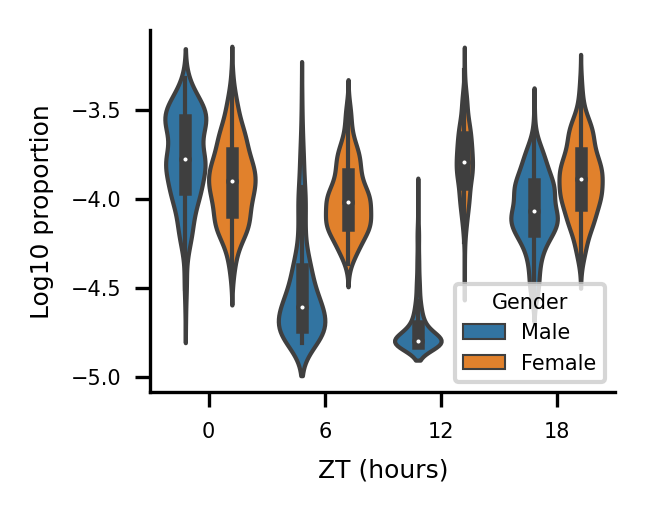

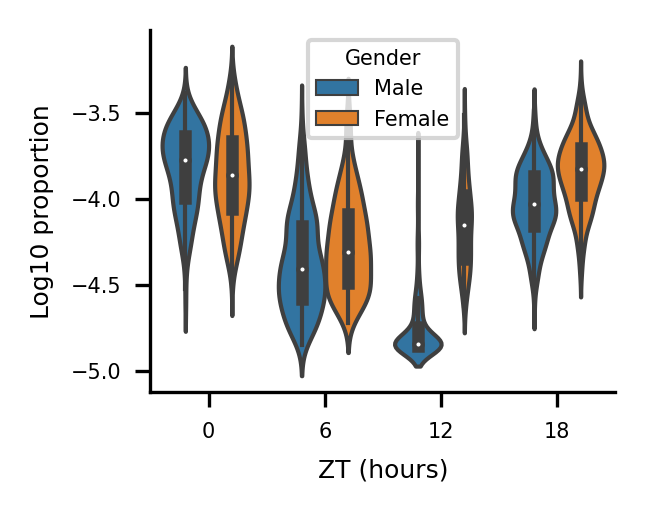

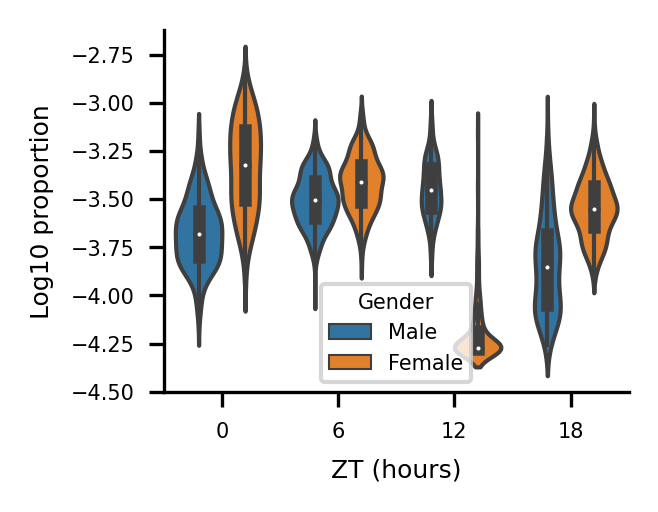

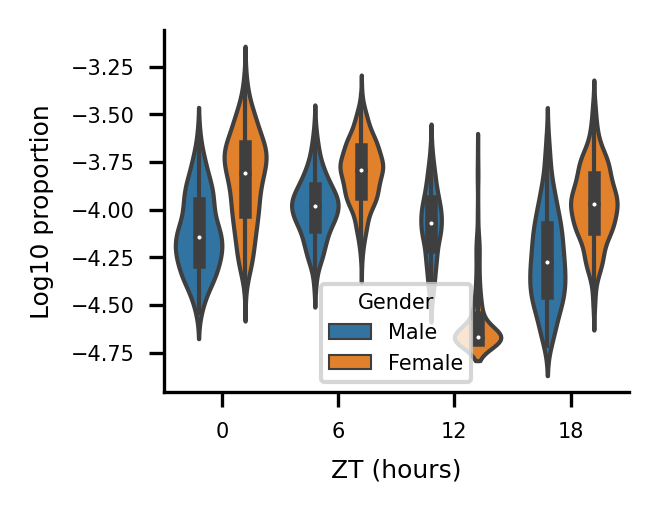

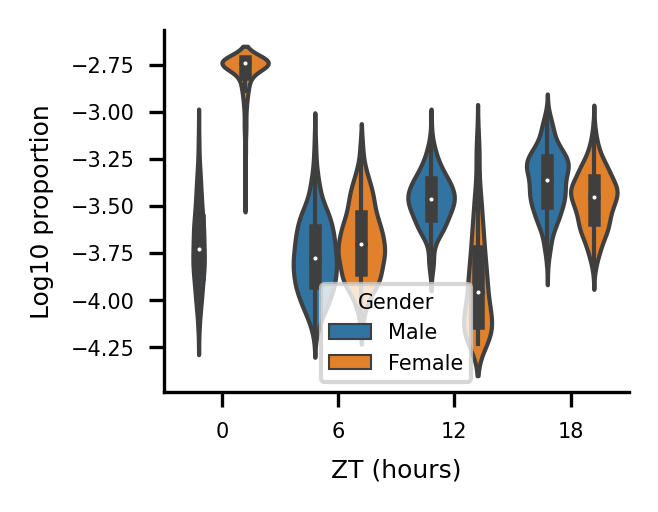

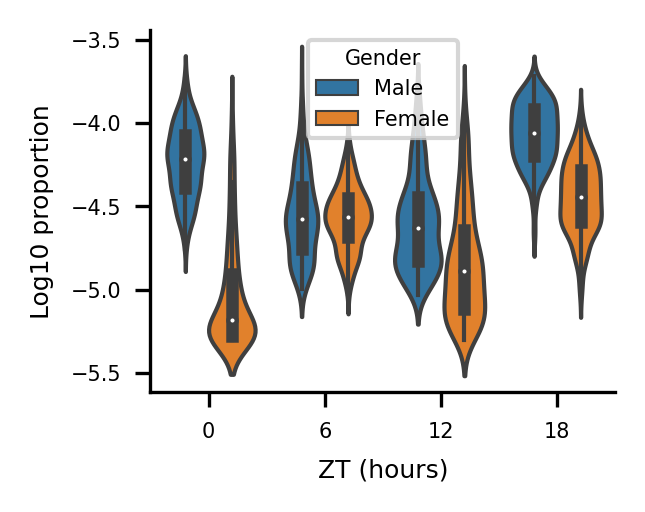

In [409]:
# ** viz the most different genes
for z, gene in enumerate(['Lpl','Ccr2', 'Hspa1a', 'Hspa1b', 'Ccl12', 'Ccn2']):
    
    try:
        sampled_log_props = [sampled_log_prop_1,sampled_log_prop_2]
        condit_label = 'Gender'
        condits = ['Male', 'Female']
        gene_of_interest = gene
        gene_names = common_genes
        import importlib
        importlib.reload(helper_functions)
        fig,ax = helper_functions.make_temporal_violin_plots(sampled_log_props, condit_label, condits, gene_of_interest, gene_names, figsize=(2,1.6),use_title=False)

        # ** make the folder out **
        subfolder_out = '%s/example_de_waveform_genes/%s/temp' % (folder_out, cluster_cell_type_dict[cluster])
        if not os.path.exists(subfolder_out):
            os.makedirs(subfolder_out)

        fileout='%s/%s_%s.pdf' % (subfolder_out,z,gene_of_interest)
        plt.savefig(fileout,bbox_inches='tight')
    
    except:
        pass
    

In [229]:
# --- GET GENES UP AND DOWNREGULATED AT EACH TIME POINT ---


# ** assessing if MAP in condition 2 falls outside of the interval from 1 **

# up
sampled_log_prop_dif = sampled_log_prop_2 - sampled_log_prop_1
interval_low = torch.Tensor(np.percentile(sampled_log_prop_1, 2.5, axis=0)) # [num_time_points x num_genes]
interval_high = torch.Tensor(np.percentile(sampled_log_prop_1, 97.5, axis=0))
samples_outside_interval = sampled_log_prop_2 > interval_high.unsqueeze(0)
up_genes_over_time = []
for time_index in [0,1,2,3]:
    up_genes = list(np.array(common_genes)[torch.where(torch.mean(sampled_log_prop_2[:,time_index,:],dim=0) > interval_high[time_index,:])[0].numpy()])    
    up_genes_over_time.append(up_genes)
    

# down
samples_outside_interval = sampled_log_prop_2 < interval_low.unsqueeze(0)
down_genes_over_time = []
for time_index in [0,1,2,3]:
    down_genes = list(np.array(common_genes)[torch.where(torch.mean(sampled_log_prop_2[:,time_index,:],dim=0) < interval_low[time_index,:])[0].numpy()])    
    down_genes_over_time.append(down_genes)
    
    
    
    
# ** fraction of samples outside of the interval **


# # thresh
# sample_frac_thresh = 0.7

# # up
# sampled_log_prop_dif = sampled_log_prop_2 - sampled_log_prop_1
# interval_low = torch.Tensor(np.percentile(sampled_log_prop_1, 2.5, axis=0)) # [num_time_points x num_genes]
# interval_high = torch.Tensor(np.percentile(sampled_log_prop_1, 97.5, axis=0))
# samples_outside_interval = sampled_log_prop_2 > interval_high.unsqueeze(0)
# fraction_samples_out_interval = torch.mean(samples_outside_interval.float(),dim=0) # [num_time_points x num_genes]
# up_genes_over_time = []
# for time_index in [0,1,2,3]:
#     up_genes = list(np.array(common_genes)[torch.where(fraction_samples_out_interval[time_index,:] >= sample_frac_thresh)[0].numpy()])
#     up_genes_over_time.append(up_genes)
    
# # down
# samples_outside_interval = sampled_log_prop_2 < interval_low.unsqueeze(0)
# fraction_samples_out_interval = torch.mean(samples_outside_interval.float(),dim=0) # [num_time_points x num_genes]
# down_genes_over_time = []
# for time_index in [0,1,2,3]:
#     down_genes = list(np.array(common_genes)[torch.where(fraction_samples_out_interval[time_index,:] >= sample_frac_thresh)[0].numpy()])
#     down_genes_over_time.append(down_genes)
    
    



In [147]:
# --- GET ENRICHED PATHWAYS OVER TIME ---

import importlib
importlib.reload(helper_functions)

signif_thresh = 0.1
for enrichment_gene_set in ['KEGG_2016','TRANSFAC_and_JASPAR_PWMs']:
    helper_functions.run_enrichment_over_time(up_genes_over_time,
                                        down_genes_over_time,
                                        enrichment_gene_set,
                                        common_genes,
                                        folder_out,
                                        cluster_cell_type_dict,
                                        cluster,
                                        sampled_log_prop_2 - sampled_log_prop_1,
                                        signif_thresh=signif_thresh)




0
1
2


Exception: Error analyzing gene list

In [114]:
# --- GET THE WAVEFORM DIFFERENCE METRICS ---

import importlib
importlib.reload(helper_functions)

# mesor metrics
frac_mesor_samples_larger, mesor_effect = helper_functions.mesor_dif_metrics(sampled_log_prop_1, sampled_log_prop_2)

# amp metrics
frac_amp_samples_larger, amp_effect = helper_functions.amp_dif_metrics(sampled_fft_1, sampled_fft_2, circadian_index)

# acrophase metrics
# frac_zero_acrophase_dif_samples, acrophase_effect = helper_functions.acrophase_dif_metrics(sampled_fft_1, sampled_fft_2, circadian_index)
frac_zero_acrophase_dif_samples, acrophase_effect, dif_acrophase_samples = helper_functions.acrophase_dif_metrics_2(sampled_fft_1, sampled_fft_2, circadian_index,hour_thresh=3)

# cosinor metrics
frac_zero_cosinor_dif_samples, cosinor_euclid_effect = helper_functions.cosinor_dif_metrics(sampled_fft_1, sampled_fft_2, circadian_index)





In [115]:
# --- MAKE DIF DF ---

waveform_dif_df = pd.DataFrame()
waveform_dif_df['gene'] = common_genes
waveform_dif_df['frac_mesor_samples_larger'] = frac_mesor_samples_larger
waveform_dif_df['mesor_effect'] = mesor_effect
waveform_dif_df['frac_amp_samples_larger'] = frac_amp_samples_larger
waveform_dif_df['amp_effect'] = amp_effect
waveform_dif_df['frac_zero_acrophase_dif_samples'] = frac_zero_acrophase_dif_samples
waveform_dif_df['acrophase_effect'] = acrophase_effect
waveform_dif_df['condit_1_frac_circadian_samples_crossing_zero'] = np.array(gene_stat_df_1['frac_circadian_samples_crossing_zero'])
waveform_dif_df['condit_2_frac_circadian_samples_crossing_zero'] = np.array(gene_stat_df_2['frac_circadian_samples_crossing_zero'])
waveform_dif_df['condit_1_waveform_over_circadian_component_subtracted_log10_bf'] = np.array(gene_stat_df_1['waveform_over_circadian_component_subtracted_log10_bf'])
waveform_dif_df['condit_2_waveform_over_circadian_component_subtracted_log10_bf'] = np.array(gene_stat_df_2['waveform_over_circadian_component_subtracted_log10_bf'])
waveform_dif_df['in_de_genes'] = np.isin(np.array(common_genes),signif_de_df.index)

waveform_dif_df = waveform_dif_df.set_index('gene')
waveform_dif_df





,frac_mesor_samples_larger,mesor_effect,frac_amp_samples_larger,amp_effect,frac_zero_acrophase_dif_samples,acrophase_effect,condit_1_frac_circadian_samples_crossing_zero,condit_2_frac_circadian_samples_crossing_zero,condit_1_waveform_over_circadian_component_subtracted_log10_bf,condit_2_waveform_over_circadian_component_subtracted_log10_bf,in_de_genes
gene,,,,,,,,,,,
0610009B22Rik,0.346667,-0.155060,0.650000,0.311033,0.233333,2.737288,0.42,0.24,-1.980163,0.920987,False
0610010K14Rik,0.566667,0.061363,0.643333,0.261999,0.300000,5.179337,0.34,0.10,-4.107441,1.933013,False
0610012G03Rik,0.323333,-0.134740,0.620000,0.185027,0.270000,0.425677,0.41,0.36,-3.617256,-3.919770,False
0610030E20Rik,0.606667,0.111867,0.393333,-0.205628,0.340000,0.516787,0.24,0.32,-1.929992,-0.955075,False
1110004F10Rik,0.480000,-0.004301,0.530000,0.087500,0.263333,5.004696,0.40,0.39,-2.641008,-2.792974,False
...,...,...,...,...,...,...,...,...,...,...,...
mt-Nd3,0.473333,-0.031217,0.720000,0.302928,0.306667,5.176098,0.25,0.26,-2.152440,-0.026640,False
mt-Nd4,0.796667,0.197537,0.600000,0.102865,0.243333,4.675592,0.40,0.30,-16.531712,-5.003929,False
mt-Nd4l,0.826667,0.256597,0.650000,0.212652,0.313333,5.776074,0.46,0.17,-3.949737,-2.139372,False


In [116]:
amp_frac_thresh = 0.9
mesor_frac_thresh = 0.9
acrophase_frac_thresh = 0.1
mesor_effect_thresh = 0.1
amp_effect_thresh = 0.1




In [117]:
# --- CALL GENES WITH DIFFERING CIRCADIAN WAVEFORMS ---


# get genes that are flat in both conditions
both_flat = (waveform_dif_df['condit_1_waveform_over_circadian_component_subtracted_log10_bf'] <= -1) & (waveform_dif_df['condit_2_waveform_over_circadian_component_subtracted_log10_bf'] <= -1)

# get genes that cycle in at least one of the conditions
one_cycles = (waveform_dif_df['condit_1_waveform_over_circadian_component_subtracted_log10_bf'] >= 2) | (waveform_dif_df['condit_2_waveform_over_circadian_component_subtracted_log10_bf'] >= 2)
both_cycle = (waveform_dif_df['condit_1_waveform_over_circadian_component_subtracted_log10_bf'] >= 2) & (waveform_dif_df['condit_2_waveform_over_circadian_component_subtracted_log10_bf'] >= 2)
both_strong_circadian_component = np.array(gene_stat_df_1['frac_circadian_samples_largest_component'] >= 0.8) & np.array(gene_stat_df_2['frac_circadian_samples_largest_component'] >= 0.8)

# get cyclers in the two conditions
is_cycler_1 = np.array(gene_stat_df_1['waveform_over_circadian_component_subtracted_log10_bf'] >= log10_bf_thresh)
is_cycler_2 = np.array(gene_stat_df_2['waveform_over_circadian_component_subtracted_log10_bf'] >= log10_bf_thresh)
# is_cycler_2 = np.array(gene_stat_df_2['frac_circadian_samples_crossing_zero'] <= frac_circadian_samples_crossing_zero_thresh)
# is_cycler_1 = np.array(gene_stat_df_1['frac_circadian_samples_crossing_zero'] <= frac_circadian_samples_crossing_zero_thresh)



# mesor 
mesor_increased = np.array(waveform_dif_df['frac_mesor_samples_larger'] >= mesor_frac_thresh) & np.array(waveform_dif_df['mesor_effect'] >= mesor_effect_thresh)
mesor_decreased = np.array(waveform_dif_df['frac_mesor_samples_larger'] <= 1 - mesor_frac_thresh) & np.array(waveform_dif_df['mesor_effect'] <= -1 * mesor_effect_thresh)
pure_mesor_increased = mesor_increased & both_flat
pure_mesor_decreased = mesor_decreased & both_flat
pure_mesor_effect = (mesor_increased | mesor_decreased) & both_flat

# amp
amp_increased = is_cycler_2 & np.array(waveform_dif_df['frac_amp_samples_larger'] >= amp_frac_thresh) & np.array(waveform_dif_df['amp_effect'] >= amp_effect_thresh)
amp_decreased = is_cycler_1 & np.array(waveform_dif_df['frac_amp_samples_larger'] <= 1 - amp_frac_thresh) & np.array(waveform_dif_df['amp_effect'] <= -1 * amp_effect_thresh)

# acrophase
acrophase_delayed = is_cycler_1 & is_cycler_2 & np.array(waveform_dif_df['frac_zero_acrophase_dif_samples'] <= acrophase_frac_thresh) & np.array(waveform_dif_df['acrophase_effect'] > 0) & np.array(np.abs(waveform_dif_df['acrophase_effect']) >= acrophase_effect_thresh)
acrophase_advanced = is_cycler_1 & is_cycler_2 & np.array(waveform_dif_df['frac_zero_acrophase_dif_samples'] <= acrophase_frac_thresh) & np.array(waveform_dif_df['acrophase_effect'] < 0) & np.array(np.abs(waveform_dif_df['acrophase_effect']) >= acrophase_effect_thresh)

# sinusoid effect
sinusoid_effect = amp_increased | amp_decreased | acrophase_delayed | acrophase_advanced
pure_sinusoid_effect = sinusoid_effect & (~(mesor_increased | mesor_decreased))


# add to df
waveform_dif_df['mesor_increased'] = mesor_increased
waveform_dif_df['mesor_decreased'] = mesor_decreased
waveform_dif_df['pure_mesor_increased'] = pure_mesor_increased
waveform_dif_df['pure_mesor_decreased'] = pure_mesor_decreased
waveform_dif_df['amp_increased'] = amp_increased
waveform_dif_df['amp_decreased'] = amp_decreased
waveform_dif_df['acrophase_delayed'] = acrophase_delayed
waveform_dif_df['acrophase_advanced'] = acrophase_advanced
waveform_dif_df['pure_sinusoid_effect'] = pure_sinusoid_effect
waveform_dif_df['pure_mesor_effect'] = pure_mesor_effect

# gene lists
mesor_increased_genes = list(waveform_dif_df[waveform_dif_df['mesor_increased']].sort_values('mesor_effect',ascending=False).index)
mesor_decreased_genes = list(waveform_dif_df[waveform_dif_df['mesor_decreased']].sort_values('mesor_effect',ascending=True).index)
pure_mesor_increased_genes = list(waveform_dif_df[waveform_dif_df['pure_mesor_increased']].sort_values('mesor_effect',ascending=False).index)
pure_mesor_decreased_genes = list(waveform_dif_df[waveform_dif_df['pure_mesor_decreased']].sort_values('mesor_effect',ascending=True).index)
amp_increased_genes = list(waveform_dif_df[waveform_dif_df['amp_increased']].sort_values('amp_effect',ascending=False).index)
amp_decreased_genes = list(waveform_dif_df[waveform_dif_df['amp_decreased']].sort_values('amp_effect',ascending=True).index)
# amp_increased_genes = list(waveform_dif_df[waveform_dif_df['amp_increased']].sort_values('frac_amp_samples_larger',ascending=False).index)
# amp_decreased_genes = list(waveform_dif_df[waveform_dif_df['amp_decreased']].sort_values('frac_amp_samples_larger',ascending=True).index)
acrophase_delayed_genes = list(waveform_dif_df[waveform_dif_df['acrophase_delayed']].sort_values('acrophase_effect',ascending=False).index)
acrophase_advanced_genes = list(waveform_dif_df[waveform_dif_df['acrophase_advanced']].sort_values('acrophase_effect',ascending=True).index)


# print out the counts
print('mesor_increased', np.sum(waveform_dif_df['mesor_increased']))
print('mesor_decreased', np.sum(waveform_dif_df['mesor_decreased']))
print('pure_mesor_increased', np.sum(waveform_dif_df['pure_mesor_increased']))
print('pure_mesor_decreased', np.sum(waveform_dif_df['pure_mesor_decreased']))
print('amp_increased', np.sum(waveform_dif_df['amp_increased']))
print('amp_decreased', np.sum(waveform_dif_df['amp_decreased']))
print('acrophase_delayed', np.sum(waveform_dif_df['acrophase_delayed']))
print('acrophase_advanced', np.sum(waveform_dif_df['acrophase_advanced']))




mesor_increased 62
mesor_decreased 157
pure_mesor_increased 13
pure_mesor_decreased 32
amp_increased 10
amp_decreased 2
acrophase_delayed 2
acrophase_advanced 0


In [26]:
# --- WRITE OUT WAVEFORM DIF DF ---


subfolder_out = '%s/waveform_dif_dfs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.tsv' % (subfolder_out,cluster_cell_type_dict[cluster])
waveform_dif_df.to_csv(fileout,sep='\t')



In [118]:
# --- ADD EXPECTED ACROPHASES ---


# ** sample acrophases **
acrophase_samples_1 = (np.arctan2(sampled_fft_1[:,circadian_index.item(),:].imag,sampled_fft_1[:,circadian_index.item(),:].real) % (2 * np.pi))
acrophase_samples_1 = ((2*np.pi) - acrophase_samples_1) % (2*np.pi)
acrophase_samples_2 = (np.arctan2(sampled_fft_2[:,circadian_index.item(),:].imag,sampled_fft_2[:,circadian_index.item(),:].real) % (2 * np.pi))
acrophase_samples_2 = ((2*np.pi) - acrophase_samples_2) % (2*np.pi)

# ** compute expected acrophases **
expected_acrophase_1 = scipy.stats.circmean(np.arctan2(sampled_fft_1[:,circadian_index].imag,sampled_fft_1[:,circadian_index].real) % (2 * np.pi),axis=0)
expected_acrophase_2 = scipy.stats.circmean(np.arctan2(sampled_fft_2[:,circadian_index].imag,sampled_fft_2[:,circadian_index].real) % (2 * np.pi),axis=0)
expected_acrophase_1 = ((2 * np.pi) - expected_acrophase_1) % (2 * np.pi)
expected_acrophase_2 = ((2 * np.pi) - expected_acrophase_2) % (2 * np.pi)
expected_acrophase_1 = (expected_acrophase_1 / np.pi) * 12.0
expected_acrophase_2 = (expected_acrophase_2 / np.pi) * 12.0
gene_stat_df_1['expected_acrophase'] = expected_acrophase_1
gene_stat_df_2['expected_acrophase'] = expected_acrophase_2







In [119]:
# --- GET OVERLAPS IN CYCLERS ---


cyclers_1 = np.array(gene_stat_df_1[gene_stat_df_1['waveform_over_circadian_component_subtracted_log10_bf'] >= 2].index)
cyclers_2 = np.array(gene_stat_df_2[gene_stat_df_2['waveform_over_circadian_component_subtracted_log10_bf'] >= 2].index)
# cyclers_1 = np.array(gene_stat_df_1[gene_stat_df_1['frac_circadian_samples_crossing_zero'] <= 0.05].index)
# cyclers_2 = np.array(gene_stat_df_2[gene_stat_df_2['frac_circadian_samples_crossing_zero'] <= 0.05].index)


union_cyclers = set(cyclers_1).union(set(cyclers_2))
inter_cyclers = set(cyclers_1).intersection(set(cyclers_2))
unique_cyclers_1 = set(cyclers_1).difference(cyclers_2)
unique_cyclers_2 = set(cyclers_2).difference(cyclers_1)
print('Male cyclers', len(cyclers_1))
print('Female cyclers', len(cyclers_2))
print('Union cyclers', len(union_cyclers))
print('Intersection cyclers', len(inter_cyclers))
print('Male unique cyclers', len(unique_cyclers_1))
print('Female unique cyclers', len(unique_cyclers_2))




Male cyclers 90
Female cyclers 92
Union cyclers 166
Intersection cyclers 16
Male unique cyclers 74
Female unique cyclers 76


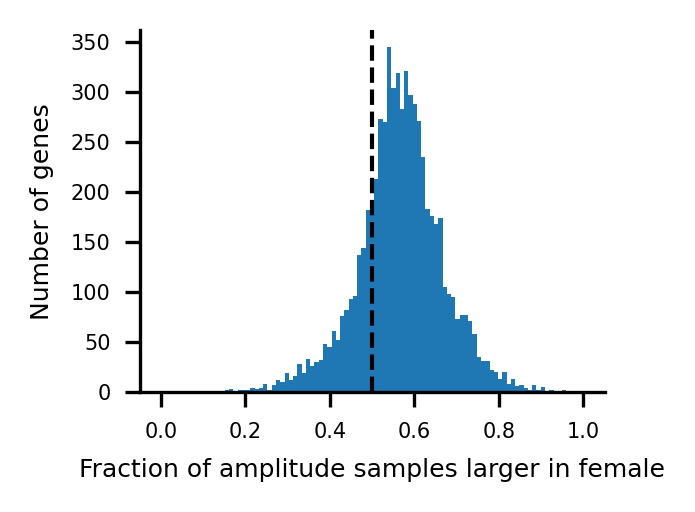

/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_42586/1324286273.py:19: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  plt.hist(waveform_dif_df['frac_amp_samples_larger'].loc[inter_cyclers],bins=np.linspace(0,1,50))


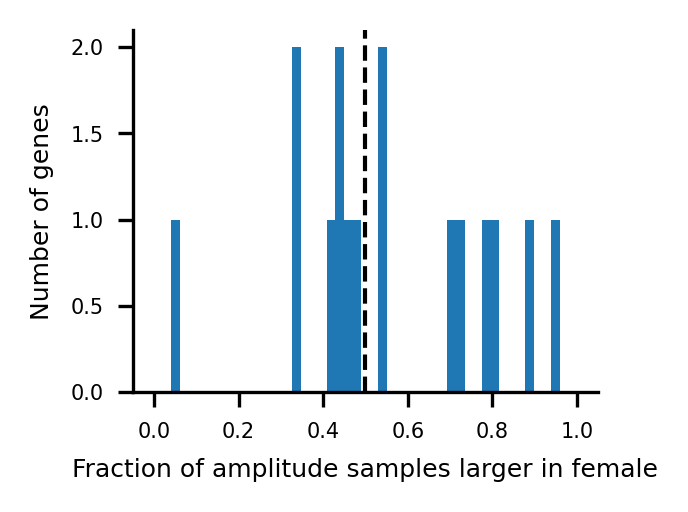

/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_42586/1324286273.py:33: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  plt.hist(waveform_dif_df['frac_amp_samples_larger'].loc[union_cyclers],bins=np.linspace(0,1,50))


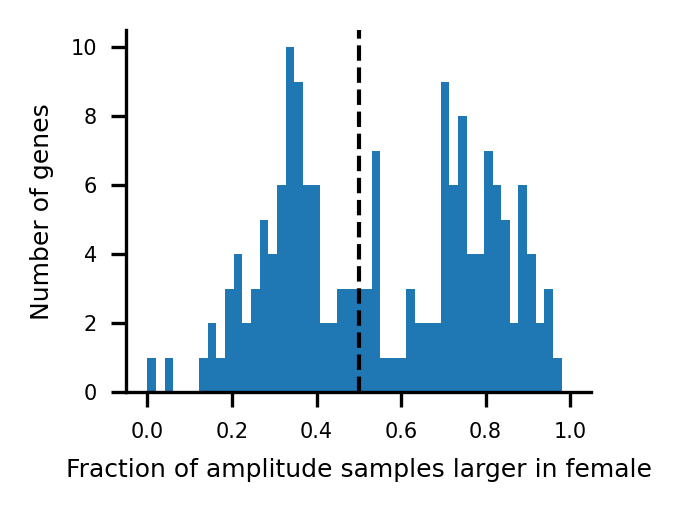

In [120]:
# --- LOOK TO SEE IF THE AMPLITUDES ARE SHIFTED IN FEMALES ---

fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.hist(waveform_dif_df['frac_amp_samples_larger'],bins=np.linspace(0,1,100))
plt.xlabel("Fraction of amplitude samples larger in female")
plt.ylabel("Number of genes")
plt.axvline(x = 0.5,c='k',linestyle='--')
subfolder_out = '%s/female_amp_frac_greater_dist_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.hist(waveform_dif_df['frac_amp_samples_larger'].loc[inter_cyclers],bins=np.linspace(0,1,50))
plt.xlabel("Fraction of amplitude samples larger in female")
plt.ylabel("Number of genes")
plt.axvline(x = 0.5,c='k',linestyle='--')
subfolder_out = '%s/female_intersection_cyclers_amp_frac_greater_dist_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.hist(waveform_dif_df['frac_amp_samples_larger'].loc[union_cyclers],bins=np.linspace(0,1,50))
plt.xlabel("Fraction of amplitude samples larger in female")
plt.ylabel("Number of genes")
plt.axvline(x = 0.5,c='k',linestyle='--')
subfolder_out = '%s/female_union_cyclers_amp_frac_greater_dist_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_42586/4261720427.py:37: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  plt.scatter(acro_df.loc[inter_cyclers]['acro_1'],acro_df.loc[inter_cyclers]['acro_2'],s=1)
/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_42586/4261720427.py:37: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  plt.scatter(acro_df.loc[inter_cyclers]['acro_1'],acro_df.loc[inter_cyclers]['acro_2'],s=1)


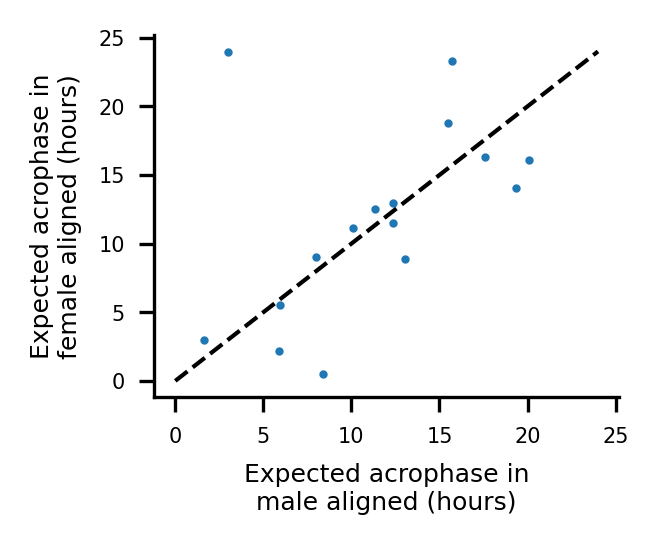

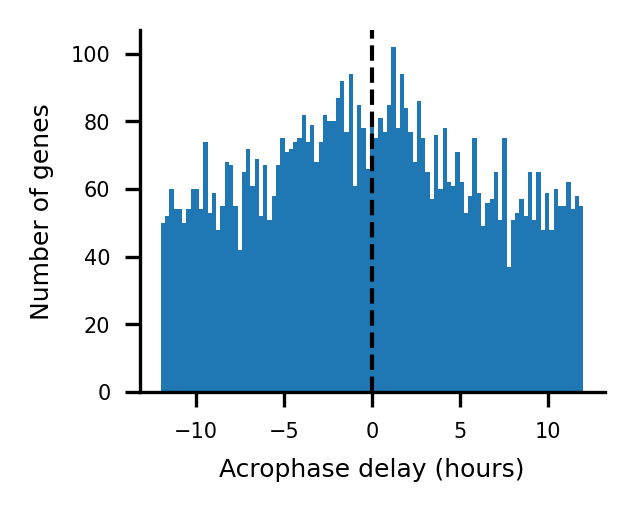

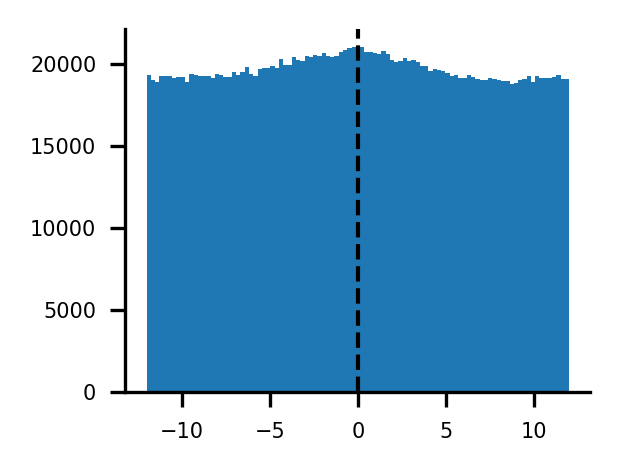

-0.7305515257413084


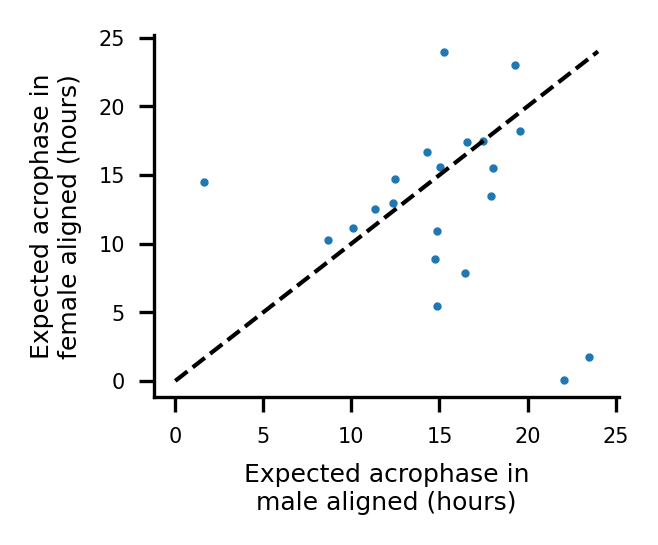

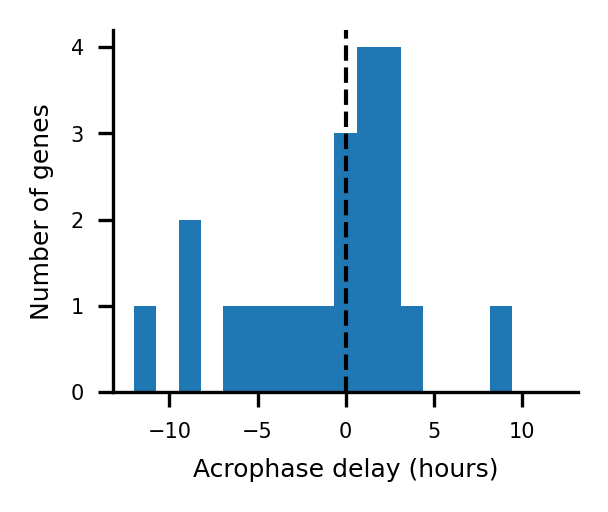

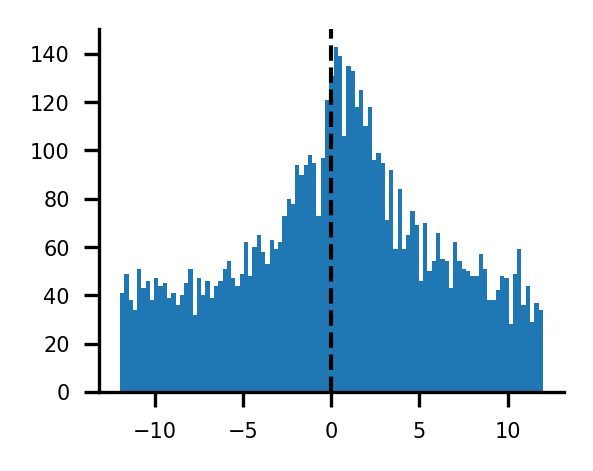

0.8483732634437899


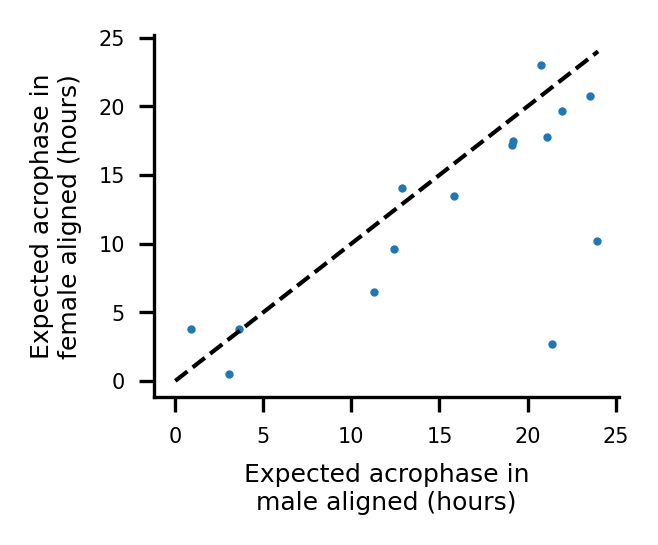

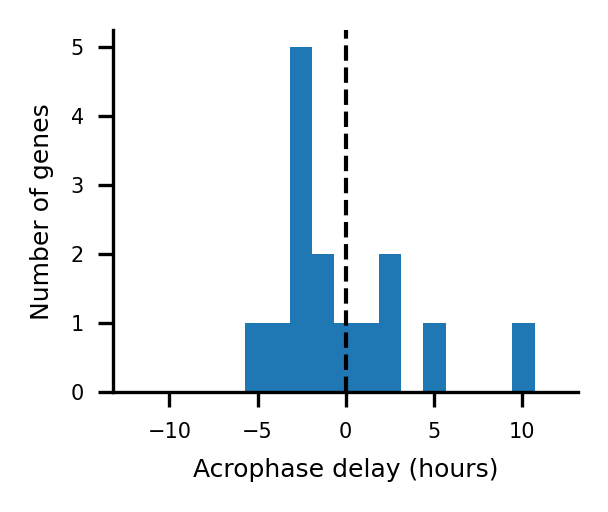

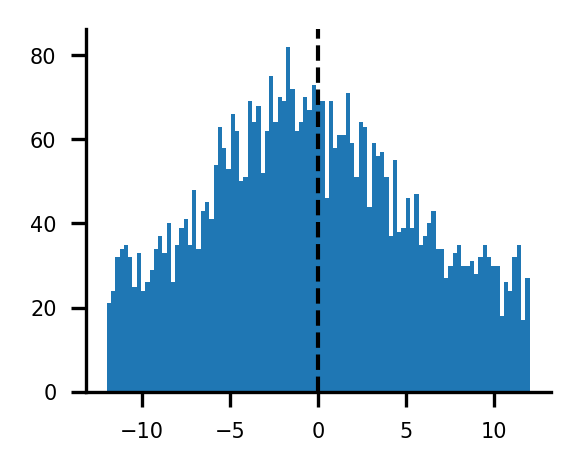

-0.9335102444235783


In [121]:
# --- lOOK AT THE ACROPHASES ---

# ** sample acrophases **
acrophase_samples_1 = (np.arctan2(sampled_fft_1[:,circadian_index.item(),:].imag,sampled_fft_1[:,circadian_index.item(),:].real) % (2 * np.pi))
acrophase_samples_1 = ((2*np.pi) - acrophase_samples_1) % (2*np.pi)
acrophase_samples_2 = (np.arctan2(sampled_fft_2[:,circadian_index.item(),:].imag,sampled_fft_2[:,circadian_index.item(),:].real) % (2 * np.pi))
acrophase_samples_2 = ((2*np.pi) - acrophase_samples_2) % (2*np.pi)



# ** compute expected acrophases **
expected_acrophase_1 = scipy.stats.circmean(np.arctan2(sampled_fft_1[:,circadian_index].imag,sampled_fft_1[:,circadian_index].real) % (2 * np.pi),axis=0)
expected_acrophase_2 = scipy.stats.circmean(np.arctan2(sampled_fft_2[:,circadian_index].imag,sampled_fft_2[:,circadian_index].real) % (2 * np.pi),axis=0)
expected_acrophase_1 = ((2 * np.pi) - expected_acrophase_1) % (2 * np.pi)
expected_acrophase_2 = ((2 * np.pi) - expected_acrophase_2) % (2 * np.pi)
expected_acrophase_1 = (expected_acrophase_1 / np.pi) * 12.0
expected_acrophase_2 = (expected_acrophase_2 / np.pi) * 12.0

# ** get expected acrophase df **
acro_df = pd.DataFrame()
acro_df['gene'] = common_genes
acro_df['acro_1'] = expected_acrophase_1
acro_df['acro_2'] = expected_acrophase_2
acro_df = acro_df.set_index("gene")


# ** compute the expected acrophase delay **
acro_dif = acro_df['acro_2'] - acro_df['acro_1']
acro_dif = acro_dif % (24.0)
acro_dif[acro_dif > 12] = acro_dif[acro_dif > 12] - 24
acro_df['acro_delay'] = np.array(acro_dif)


# ** plot **
fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.scatter(acro_df.loc[inter_cyclers]['acro_1'],acro_df.loc[inter_cyclers]['acro_2'],s=1)
plt.plot(np.linspace(0,24,100),np.linspace(0,24,100),c='k',alpha=1.0,linestyle='--')
plt.xlabel("Expected acrophase in\nmale aligned (hours)")
plt.ylabel("Expected acrophase in\nfemale aligned (hours)")
subfolder_out = '%s/male_vs_female_aligned_acrophase_inter_cyclers_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


# ** plot the difs **
fig,ax=plt.subplots(figsize=(2,1.6),dpi=300)
sns.despine()
plt.hist(acro_df['acro_delay'],bins=np.linspace(-12,12,100))
plt.xlabel("Acrophase delay (hours)")
plt.ylabel("Number of genes")
plt.axvline(x = 0,c='k',linestyle='--')
fileout = '%s/acro_dif_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


# ** viz **
acrophase_dif_samples = ((acrophase_samples_2 / np.pi) * 12.0) - ((acrophase_samples_1 / np.pi) * 12.0)
acrophase_dif_samples = acrophase_dif_samples % (24.0)
acrophase_dif_samples[acrophase_dif_samples > 12] = acrophase_dif_samples[acrophase_dif_samples > 12] - 24
gene_indices = np.where(np.isin(np.array(common_genes), common_genes))[0] # inter_cyclers, ubiq_genes
fig,ax=plt.subplots(figsize=(2,1.6),dpi=300)
plt.hist(acrophase_dif_samples[:,gene_indices].flatten(),bins=np.linspace(-12,12,100))
sns.despine()
plt.axvline(x = 0,c='k',linestyle='--')
plt.show()


print(scipy.stats.circmean(acrophase_dif_samples[:,gene_indices].flatten(),low=-12,high=12))






# ** plot for core clock genes only **
core_clock_genes = [
    "Arntl",
    "Arntl2",
    "Clock",
    "Per1",
    "Per2",
    "Per3",
    "Cry1",
    "Cry2",
    "Nampt",
    "Rorc",
    "Rora",
    "Nr1d1",
    "Nr1d2",
    "Npas2",
    'Fbxo3', 
    'Fbxo21', 
    'Gm129', 
    'Dbp', 
    'Tef', 
    'Hlf', 
    'Csnk1a1', 
    'Csnk1d', 
    'Csnk1e',
    'Ciart',
    'Bhlhe40', # questionably clock gene...
    'Bhlhe41',
    "Dec1",
    "Dec2",
    'Nfil3']
core_clock_genes = list(filter(lambda x: x in common_genes,core_clock_genes))


fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.scatter(acro_df.loc[core_clock_genes]['acro_1'],acro_df.loc[core_clock_genes]['acro_2'],s=1)
plt.plot(np.linspace(0,24,100),np.linspace(0,24,100),c='k',alpha=1.0,linestyle='--')
plt.xlabel("Expected acrophase in\nmale aligned (hours)")
plt.ylabel("Expected acrophase in\nfemale aligned (hours)")
subfolder_out = '%s/male_vs_female_aligned_acrophase_clock_genes_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


# ** plot the difs **
fig,ax=plt.subplots(figsize=(2,1.6),dpi=300)
sns.despine()
plt.hist(acro_df['acro_delay'].loc[core_clock_genes],bins=np.linspace(-12,12,20))
plt.xlabel("Acrophase delay (hours)")
plt.ylabel("Number of genes")
plt.axvline(x = 0,c='k',linestyle='--')
fileout = '%s/acro_dif_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()




# ** viz **
acrophase_dif_samples = ((acrophase_samples_2 / np.pi) * 12.0) - ((acrophase_samples_1 / np.pi) * 12.0)
acrophase_dif_samples = acrophase_dif_samples % (24.0)
acrophase_dif_samples[acrophase_dif_samples > 12] = acrophase_dif_samples[acrophase_dif_samples > 12] - 24
gene_indices = np.where(np.isin(np.array(common_genes), core_clock_genes))[0] # inter_cyclers, ubiq_genes
fig,ax=plt.subplots(figsize=(2,1.6),dpi=300)
plt.hist(acrophase_dif_samples[:,gene_indices].flatten(),bins=np.linspace(-12,12,100))
sns.despine()
plt.axvline(x = 0,c='k',linestyle='--')
plt.show()


print(scipy.stats.circmean(acrophase_dif_samples[:,gene_indices].flatten(),low=-12,high=12))




# ** plot for ubiqitous cycling genes only **
ubiq_genes = [
    "CDKN1A",
    "MMP14",
    "POR",
    "WEE1",
    "SLC16A1",
    "TSC22D3",
    "NA",
    "TENC1",
    "USP2",
    "FMO2",
    "TSPAN4",
    "LEO1",
    "TMEM57",
    "STK35",
    "LONRF3",
    "GRAMD4",
    "COQ10B",
    "DTX4",
    "C1orf51"
    ]

ubiq_genes = list(map(lambda x: x.lower().capitalize(), ubiq_genes))
ubiq_genes = list(filter(lambda x: x in common_genes,ubiq_genes))


fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.scatter(acro_df.loc[ubiq_genes]['acro_1'],acro_df.loc[ubiq_genes]['acro_2'],s=1)
plt.plot(np.linspace(0,24,100),np.linspace(0,24,100),c='k',alpha=1.0,linestyle='--')
plt.xlabel("Expected acrophase in\nmale aligned (hours)")
plt.ylabel("Expected acrophase in\nfemale aligned (hours)")
subfolder_out = '%s/male_vs_female_aligned_acrophase_ubiq_cyclers_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()



# ** plot the difs **
fig,ax=plt.subplots(figsize=(2,1.6),dpi=300)
sns.despine()
plt.hist(acro_df['acro_delay'].loc[ubiq_genes],bins=np.linspace(-12,12,20))
plt.xlabel("Acrophase delay (hours)")
plt.ylabel("Number of genes")
plt.axvline(x = 0,c='k',linestyle='--')
fileout = '%s/acro_dif_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()



# ** viz **
acrophase_dif_samples = ((acrophase_samples_2 / np.pi) * 12.0) - ((acrophase_samples_1 / np.pi) * 12.0)
acrophase_dif_samples = acrophase_dif_samples % (24.0)
acrophase_dif_samples[acrophase_dif_samples > 12] = acrophase_dif_samples[acrophase_dif_samples > 12] - 24
gene_indices = np.where(np.isin(np.array(common_genes), ubiq_genes))[0] # inter_cyclers, ubiq_genes
fig,ax=plt.subplots(figsize=(2,1.6),dpi=300)
plt.hist(acrophase_dif_samples[:,gene_indices].flatten(),bins=np.linspace(-12,12,100))
sns.despine()
plt.axvline(x = 0,c='k',linestyle='--')
plt.show()


print(scipy.stats.circmean(acrophase_dif_samples[:,gene_indices].flatten(),low=-12,high=12))

 
 
    
    


/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_42586/3524995541.py:7: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  plt.hist(gene_stat_df_1.loc[inter_cyclers]['expected_acrophase'],bins=np.linspace(0,24,24))


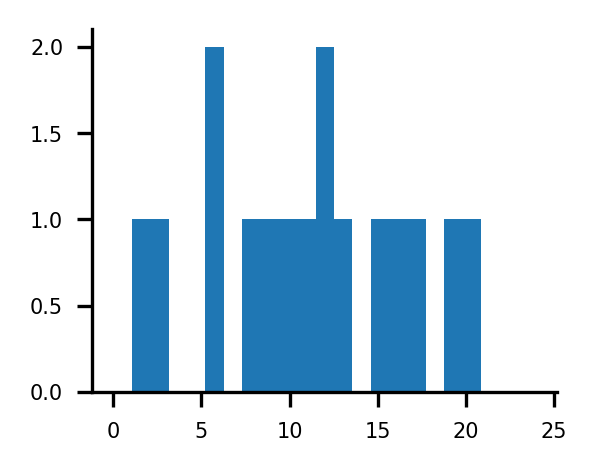

/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_42586/3524995541.py:12: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  plt.hist(gene_stat_df_2.loc[inter_cyclers]['expected_acrophase'],bins=np.linspace(0,24,24))


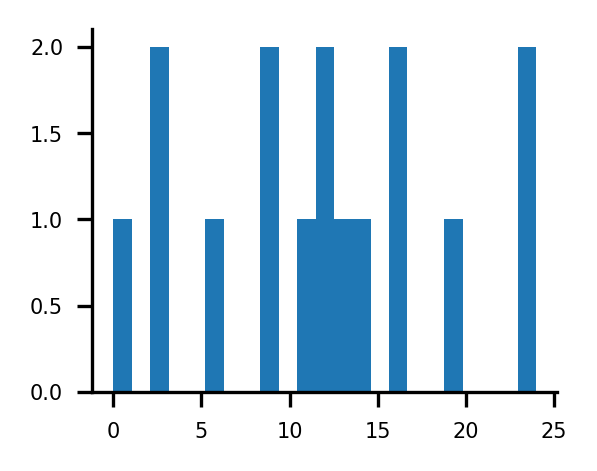

/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_42586/3524995541.py:18: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  plt.hist(gene_stat_df_2.loc[unique_cyclers_2]['expected_acrophase'],bins=np.linspace(0,24,24))


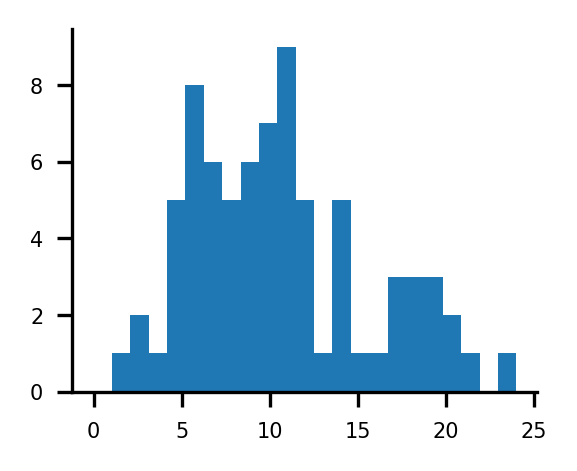

/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_42586/3524995541.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  plt.hist(gene_stat_df_1.loc[unique_cyclers_1]['expected_acrophase'],bins=np.linspace(0,24,24))


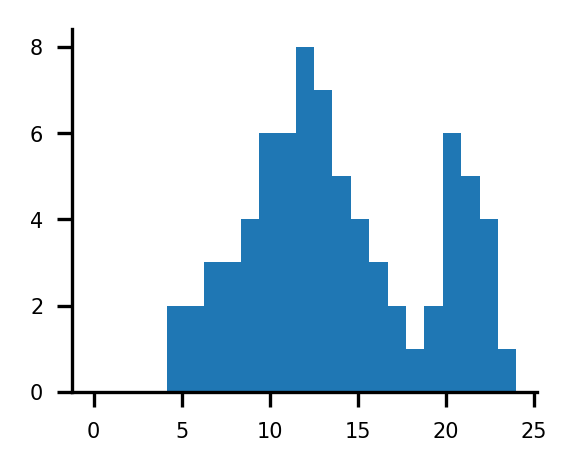

In [122]:
# --- LOOK AT WHEN INTER AND UNIQUE CYCLERS PEAK ---

gene_stat_df_1

fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.hist(gene_stat_df_1.loc[inter_cyclers]['expected_acrophase'],bins=np.linspace(0,24,24))
plt.show()

fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.hist(gene_stat_df_2.loc[inter_cyclers]['expected_acrophase'],bins=np.linspace(0,24,24))
plt.show()


fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.hist(gene_stat_df_2.loc[unique_cyclers_2]['expected_acrophase'],bins=np.linspace(0,24,24))
plt.show()


fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.hist(gene_stat_df_1.loc[unique_cyclers_1]['expected_acrophase'],bins=np.linspace(0,24,24))
plt.show()


In [33]:
# --- SET THE GENE ENRICHMENT SETS ---

import gseapy
enrichment_gene_sets = ['TRANSFAC_and_JASPAR_PWMs', 'GO_Biological_Process_2018','KEGG_2016']




In [34]:
# --- GET THE GENE SET LIST OF LISTS ---


de_gene_set_list = [mesor_increased_genes,
                    mesor_decreased_genes,
                    amp_increased_genes,
                    amp_decreased_genes, 
                    acrophase_delayed_genes, 
                    acrophase_advanced_genes]
de_gene_set_name_list = ['mesor_increased',
                         'mesor_decreased',
                         'amp_increased',
                         'amp_decreased', 
                         'acrophase_delayed', 
                         'acrophase_advanced']



In [35]:
# --- LOOK AT PATHWAY ENRICHMENT FOR THE DE GENE SETS ---

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

for de_gene_set,de_gene_set_name in zip(de_gene_set_list,de_gene_set_name_list):
    for enrichment_gene_set in enrichment_gene_sets:
            
            
        res_df = pd.DataFrame()
        if len(de_gene_set) > 0:

            # get enrichment results
            res = gseapy.enrichr(gene_list=de_gene_set,
                                 gene_sets = enrichment_gene_set,
                                organism = 'mouse',
                                background=list(reg_genes_to_est),
                                cutoff=1.0)


            # get the DF
            res_df = res.results
            res_df = res_df.set_index("Gene_set")

        # make the subfolder
        subfolder_out = '%s/%s_enrichment/%s' % (folder_out,de_gene_set_name,enrichment_gene_set)
        if not os.path.exists(subfolder_out):
            os.makedirs(subfolder_out)
        fileout = '%s/cluster_%s_enrichment.tsv' % (subfolder_out,cluster_cell_type_dict[cluster])
        res_df.to_csv(fileout,sep='\t')

    
    


In [36]:
# --- LOAD ADATAS ---

# ** condit 1 **
cluster_adata_1 = adata[(adata.obs['description'] == condit_1) & (adata.obs['cluster'] == cluster)]
cluster_adata_1 = cluster_adata_1[:,common_genes]

# ** condit 2 **
cluster_adata_2 = adata[(adata.obs['description'] == condit_2) & (adata.obs['cluster'] == cluster)]
cluster_adata_2 = cluster_adata_2[:,common_genes]




In [37]:
# --- UPDATE THE LISTS TO INCLUDE GENES OF INTEREST ---



de_gene_set_name_list += ['genes_of_interest']
genes_of_interest = ['Atf3', 'Klf4','Nr4a2', 'Nr4a1', 'Adamts4', 'Vegfa', 'Hspa1a', 'Hspa1b', 'Hba-a2', 'Hba-a1', 'Hbb-bt', 'Hbb-bs', 'Arntl', 'Dbp', 'Ccr2','Ccl2','Ptgs2','Ptges3l','Ptgfr','Hpgd','Ptafr','Rock2', 'Rac1', 'Nrf2', 'Bcl2', 'Fam107a', 'Ifit3', 'Mcp1', 'S1pr1', 'S1pr2', 'S1pr3', 'S1pr4', 'S1pr5']
de_gene_set_list.append(genes_of_interest)








/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_37083/2725841817.py:80: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (3,1.6),dpi=300)


Adamts4 not in common genes
Hba-a2 not in common genes
Hba-a1 not in common genes
Hbb-bt not in common genes
Hbb-bs not in common genes
Ccr2 not in common genes
Ccl2 not in common genes
Ptges3l not in common genes
Ptgfr not in common genes
Hpgd not in common genes
Ptafr not in common genes
Nrf2 not in common genes
Mcp1 not in common genes
S1pr2 not in common genes
S1pr3 not in common genes
S1pr5 not in common genes


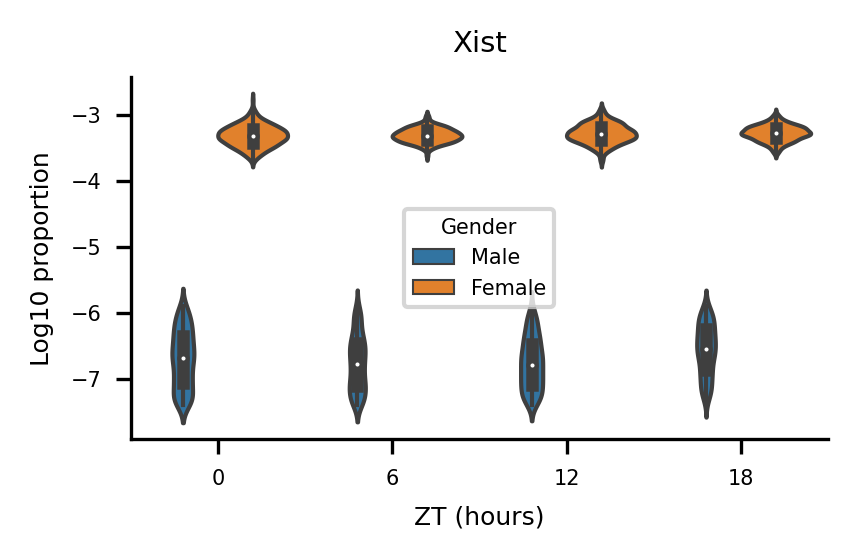

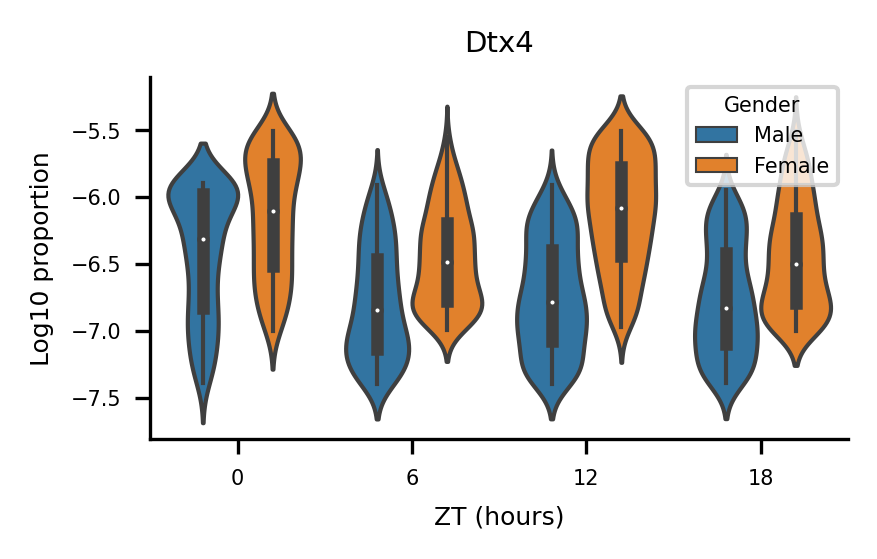

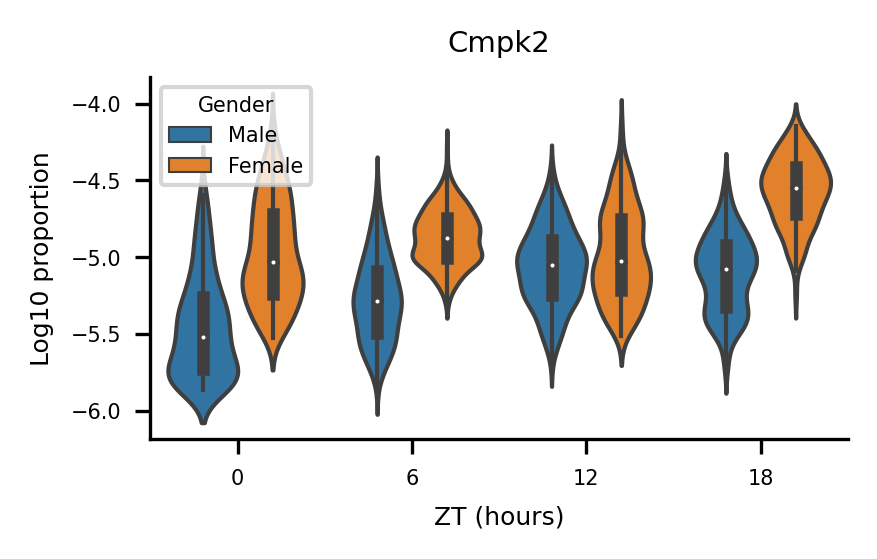

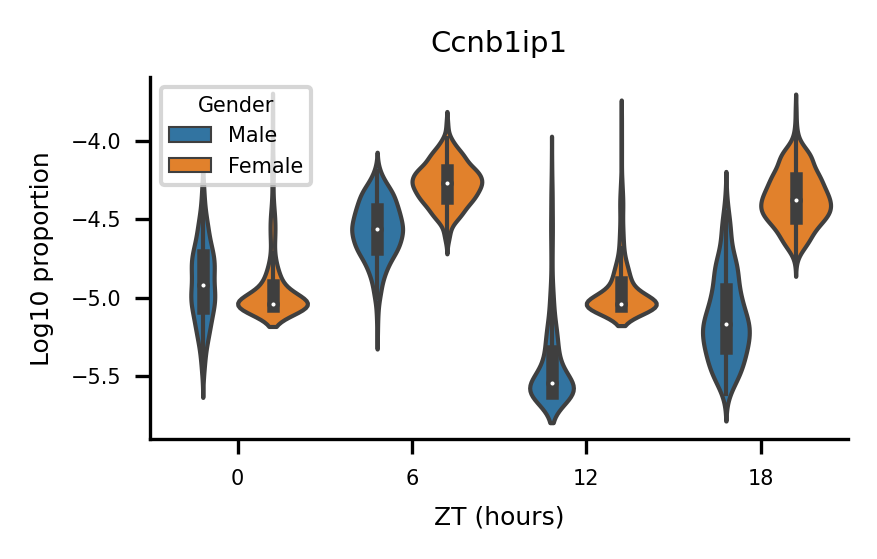

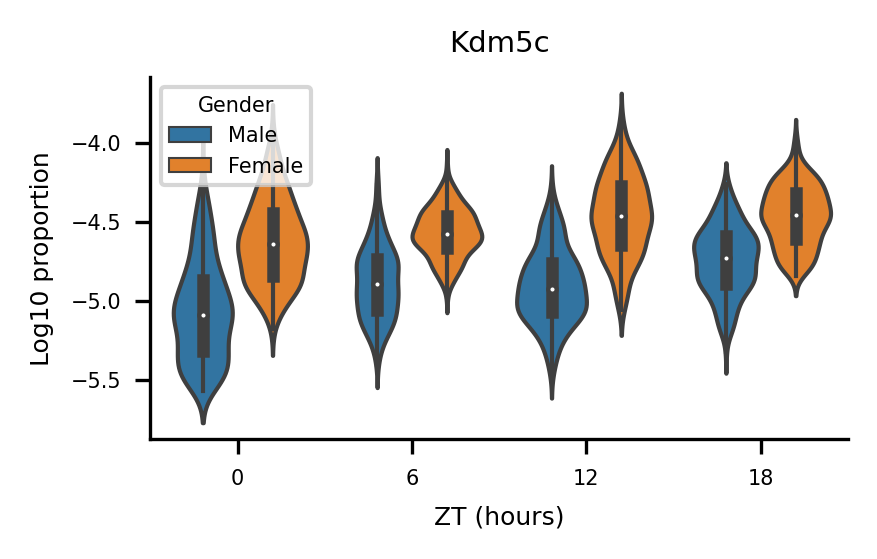

...

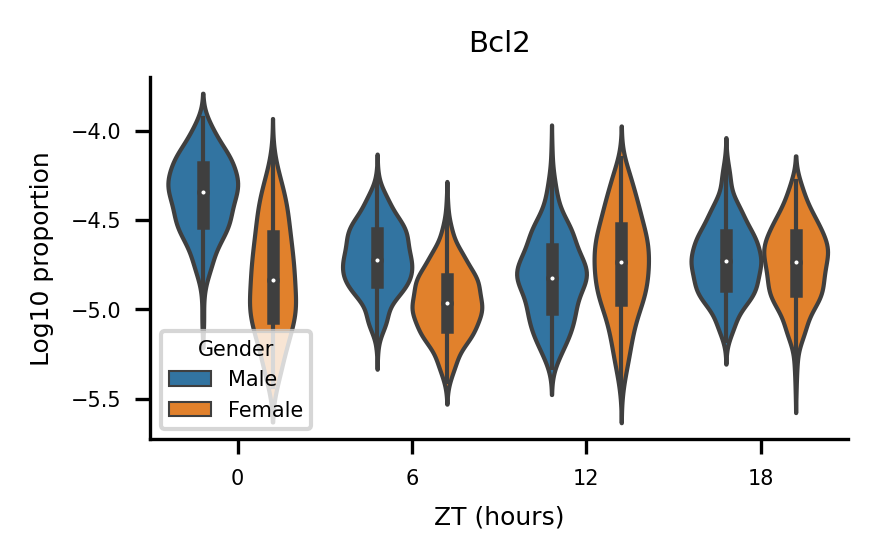

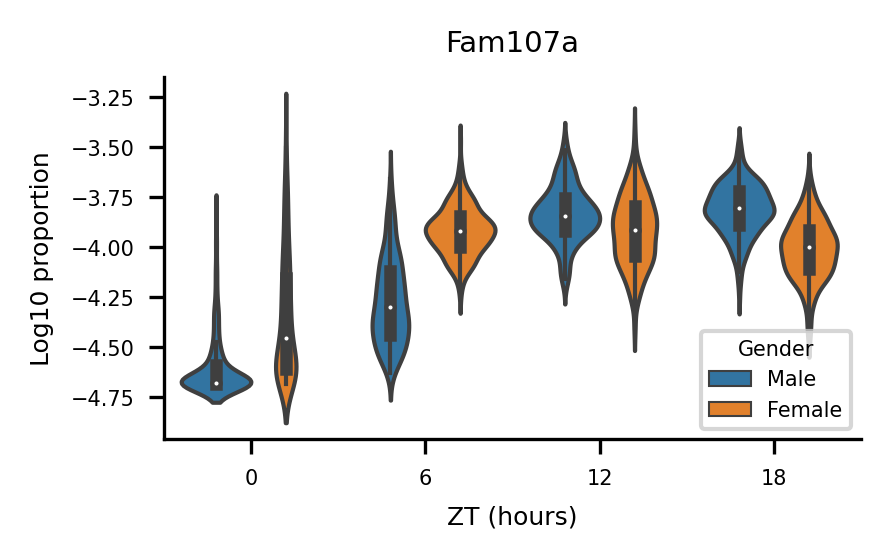

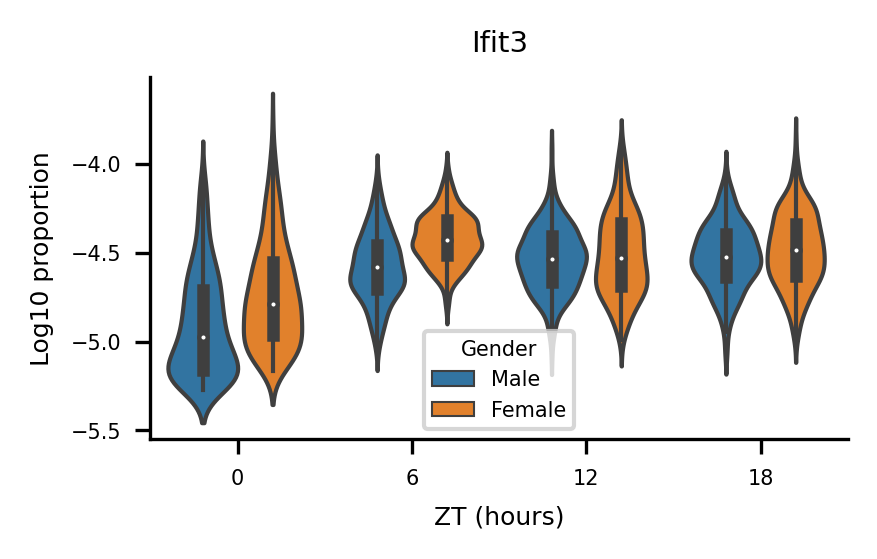

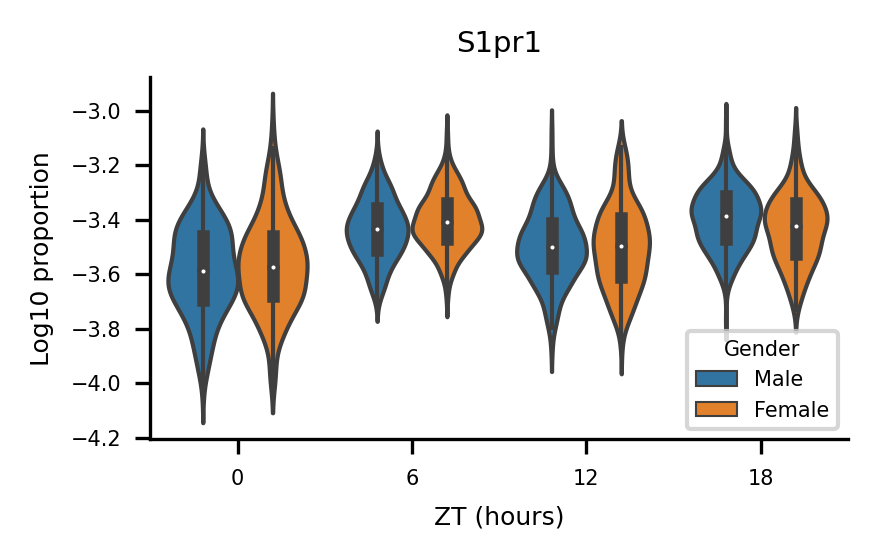

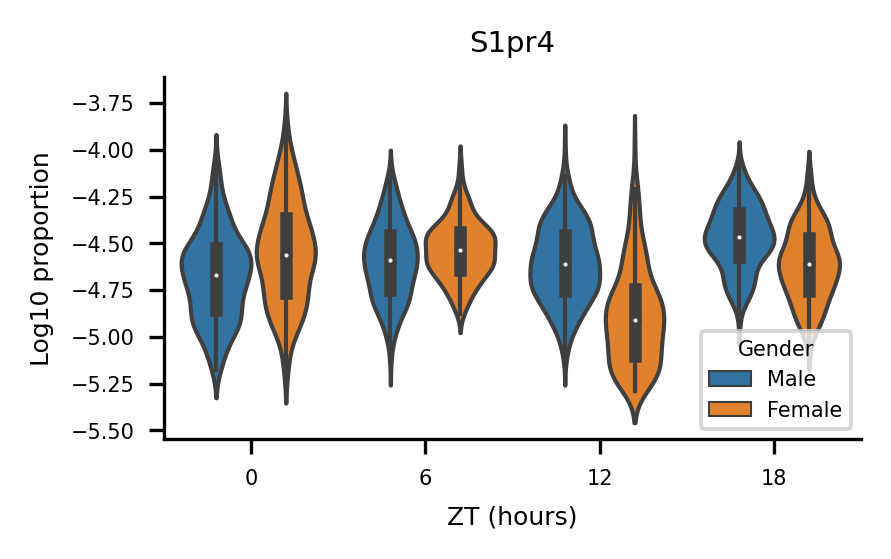

In [38]:
# --- VIZ EXAMPLES FOR TOP DIFF WAVEFORM GENES ---


num_genes_per_set = 100
for de_gene_set, de_gene_set_name in zip(de_gene_set_list, de_gene_set_name_list):
    
    # take only a subset of the genes (unless gene set of interest)
    de_gene_set_subset = de_gene_set
    if de_gene_set_name != 'genes_of_interest':
        de_gene_set_subset = de_gene_set[:min(len(de_gene_set),num_genes_per_set)]
        
    
    for z, gene_of_interest in enumerate(de_gene_set_subset):

        
        # ** make the folder out **
        subfolder_out = '%s/example_de_waveform_genes/%s/%s' % (folder_out, cluster_cell_type_dict[cluster], de_gene_set_name)
        if not os.path.exists(subfolder_out):
            os.makedirs(subfolder_out)

            
        
        # ** get the gene index **
        if gene_of_interest not in common_genes:
            print("%s not in common genes" % gene_of_interest)
            continue
        gene_index = np.where(np.array(common_genes) == gene_of_interest)[0]


#         # ** pseudobulk props **

#         # make fig
#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()

#         # condit 1
#         props = []
#         for zt in [0,6,12,18]:
#             zt_adata = cluster_adata_1[cluster_adata_1.obs['zt'] == zt]
#             prop = np.sum(zt_adata[:,gene_of_interest].X) / np.sum(zt_adata.obs['lib_size'])
#             props.append(prop)
#         plt.scatter([0,6,12,18],np.log10(np.array(props)),s=1,label=condit_1)
#         plt.xlabel("ZT (hours)")

#         # condit 2
#         props = []
#         for zt in [0,6,12,18]:
#             zt_adata = cluster_adata_2[cluster_adata_2.obs['zt'] == zt]
#             prop = np.sum(zt_adata[:,gene_of_interest].X) / np.sum(zt_adata.obs['lib_size'])
#             props.append(prop)
#         plt.scatter([0,6,12,18],np.log10(np.array(props)),s=1,label=condit_2)
#         plt.xlabel("ZT (hours)")
#         plt.ylabel("Log10 proportion")

#         # viz
#         plt.title(gene_of_interest)
#         plt.legend()
        
        
        
        # ** prop distribs over time **
        
        # make gene df
        val_mat = torch.cat((sampled_log_prop_1[:,:,gene_index.item()].unsqueeze(2),sampled_log_prop_2[:,:,gene_index.item()].unsqueeze(2)),dim=2)
        time_mat = np.zeros((num_waveform_samples, 4,2))
        time_mat[:,0,:] = 0
        time_mat[:,1,:] = 6
        time_mat[:,2,:] = 12
        time_mat[:,3,:] = 18
        hue_mat = np.zeros((num_waveform_samples, 4,2)).astype(str)
        hue_mat[:,:,0] = 'Male'
        hue_mat[:,:,1] = 'Female'
        gene_df = pd.DataFrame()
        gene_df['ZT'] = time_mat.flatten().astype(int)
        gene_df['Gender'] = hue_mat.flatten()
        gene_df['Log10 prop'] = val_mat.flatten().numpy() / np.log(10)


        # viz
        fig, ax = plt.subplots(figsize = (3,1.6),dpi=300)
        sns.despine()
        sns.violinplot(x="ZT", y="Log10 prop", data=gene_df,ax=ax,hue='Gender')
        plt.xlabel("ZT (hours)")
        plt.ylabel("Log10 proportion")
        fileout='%s/%s_%s.pdf' % (subfolder_out,z,gene_of_interest)
        plt.title(gene_of_interest)
        plt.savefig(fileout,bbox_inches='tight')
        # plt.show()

        



#         # ** mesor distributions **

#         log10_mesor_samples_1 = torch.mean(sampled_log_prop_1,dim=1)[:,gene_index].numpy().flatten() / np.log(10)
#         log10_mesor_samples_2 = torch.mean(sampled_log_prop_2,dim=1)[:,gene_index].numpy().flatten() / np.log(10)
#         min_val = min(np.min(log10_mesor_samples_1),np.min(log10_mesor_samples_2)) - 0.5
#         max_val = max(np.max(log10_mesor_samples_1),np.max(log10_mesor_samples_2)) + 0.5


#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist(log10_mesor_samples_1,bins=np.linspace(min_val,max_val,100))
#         plt.xlabel("Log10 mesor")
#         plt.ylabel("Number of samples")
#         plt.title("%s for %s" % (condit_1, gene_of_interest))
#         plt.show()



#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist(log10_mesor_samples_2,bins=np.linspace(min_val,max_val,100))
#         plt.xlabel("Log10 mesor")
#         plt.ylabel("Number of samples")
#         plt.title("%s for %s" % (condit_2, gene_of_interest))
#         plt.show()


#         # ** amplitude distributions **


#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist(abs(sampled_fft_1)[:,circadian_index,gene_index].flatten() / np.log(10),bins=np.linspace(0,2,100))
#         plt.xlabel("Log10 amplitude")
#         plt.ylabel("Number of samples")
#         plt.title("Male circadian amplitude posterior for %s" % gene_of_interest)
#         plt.show()


#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist(abs(sampled_fft_2)[:,circadian_index,gene_index].flatten() / np.log(10),bins=np.linspace(0,2,100))
#         plt.xlabel("Log10 amplitude")
#         plt.ylabel("Number of samples")
#         plt.title("Female circadian amplitude posterior for %s" % gene_of_interest)
#         plt.show()



#         # ** get acrophase samples **
#         acrophase_samples_1 = (np.arctan2(sampled_fft_1[:,circadian_index.item(),gene_index].imag,sampled_fft_1[:,circadian_index.item(),gene_index].real) % (2 * np.pi))
#         acrophase_samples_2 = (np.arctan2(sampled_fft_2[:,circadian_index.item(),gene_index].imag,sampled_fft_2[:,circadian_index.item(),gene_index].real) % (2 * np.pi))


#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist((acrophase_samples_1 / np.pi) * 12.0,bins=np.linspace(0,24,100))
#         plt.xlabel("Acrophase (hours)")
#         plt.ylabel("Number of samples")
#         plt.title("Male circadian acrophase posterior for %s" % gene_of_interest)
#         plt.show()


#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist((acrophase_samples_2 / np.pi) * 12.0,bins=np.linspace(0,24,100))
#         plt.xlabel("Acrophase (hours)")
#         plt.ylabel("Number of samples")
#         plt.title("Female circadian acrophase posterior for %s" % gene_of_interest)
#         plt.show()

        





In [52]:
# --- VIZ THE RELATIONSHIP BETWEEN CIRCADIAN BF'S ---

min_val = min(np.min(gene_stat_df_1['waveform_over_circadian_component_subtracted_log10_bf']), np.min(gene_stat_df_2['waveform_over_circadian_component_subtracted_log10_bf']))
max_val = max(np.max(gene_stat_df_1['waveform_over_circadian_component_subtracted_log10_bf']), np.max(gene_stat_df_2['waveform_over_circadian_component_subtracted_log10_bf']))

fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.scatter(gene_stat_df_1['waveform_over_circadian_component_subtracted_log10_bf'],gene_stat_df_2['waveform_over_circadian_component_subtracted_log10_bf'],s=1,alpha=0.8)
plt.plot(np.linspace(min_val,max_val,1000),np.linspace(min_val,max_val,1000),c='k',alpha=0.7,linestyle='--')
plt.xlabel("Male log10 bayes factor")
plt.ylabel("Female log10 bayes factor")
subfolder_out = '%s/female_vs_male_bayes_factor_fig' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.title("Female vs. male gene circadian bayes factors")
plt.show()















NameError: name 'gene_stat_df_1' is not defined